# Regression analysis for the "Weather in Szeged 2006-2016" dataset

The dataset provides hourly weather measurements for Szeged, Hungary, spanning from 2006 to 2016. It contains 12 different weather metrics.

The measurements include basic data like timestamp and weather descriptions, temperature readings (both actual and perceived), atmospheric conditions (humidity, pressure, cloud cover), and wind characteristics (speed and direction). Visibility data is recorded in kilometers, temperatures in Celsius, wind speed in meters per second, and wind direction in degrees (with 0° indicating north).

The dataset also includes both hourly weather summaries and broader daily weather descriptions.

Each hour's entry contains:

- Temporal information (date and time)
- Weather condition descriptions
- Precipitation details
- Temperature measurements (actual and "feels like")
- Atmospheric readings (humidity percentage, pressure in hectopascals)
- Wind measurements (speed and directional bearing)
- Visibility distance
- Cloud coverage percentage
- Overall daily weather summary

The main goal of this project is to select the best regression model among all possible models using a variety of techniques. The model will then be useful for predicting different values of the target variable given certain levels of the independent variables

In this project, we are going to analyze the factors that affect the dependent variable (which will be further chosen) in Szeged, Hungary based on the weather data in the place from 2006 to 2016

Loading and viewing the dataset

In [ ]:
# Importing necessary libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score
from statsmodels.api import OLS, add_constant

# Load the dataset
from google.colab import files
uploaded = files.upload()
url = "weatherHistory.csv"
data = pd.read_csv(url)

Saving weatherHistory.csv to weatherHistory (1).csv


In [ ]:
data.columns = ['time', 'summary', 'precipType', 'temperature', 'apparentTemperature',
                  'humidity', 'windSpeed', 'windBearing', 'visibility', 'loudCover',
                  'pressure', 'Daily Summary']

# we replaced formatted date with time

In [ ]:
data = data[1:]  # Remove the first row from data

In [ ]:
data.columns

Index(['time', 'summary', 'precipType', 'temperature', 'apparentTemperature',
       'humidity', 'windSpeed', 'windBearing', 'visibility', 'loudCover',
       'pressure', 'Daily Summary'],
      dtype='object')

In [ ]:
data.head()

,time,summary,precipType,temperature,apparentTemperature,humidity,windSpeed,windBearing,visibility,loudCover,pressure,Daily Summary
2,2006-04-01 02:00:00.000 +0200,Mostly Cloudy,rain,9.377778,9.377778,0.89,3.9284,204.0,14.9569,0.0,1015.94,Partly cloudy throughout the day.
3,2006-04-01 03:00:00.000 +0200,Partly Cloudy,rain,8.288889,5.944444,0.83,14.1036,269.0,15.8263,0.0,1016.41,Partly cloudy throughout the day.
4,2006-04-01 04:00:00.000 +0200,Mostly Cloudy,rain,8.755556,6.977778,0.83,11.0446,259.0,15.8263,0.0,1016.51,Partly cloudy throughout the day.
5,2006-04-01 05:00:00.000 +0200,Partly Cloudy,rain,9.222222,7.111111,0.85,13.9587,258.0,14.9569,0.0,1016.66,Partly cloudy throughout the day.
6,2006-04-01 06:00:00.000 +0200,Partly Cloudy,rain,7.733333,5.522222,0.95,12.3648,259.0,9.9820,0.0,1016.72,Partly cloudy throughout the day.


Let's rename columns for better clarity and easier implementation

Data Context :

- **time**: The date and time of the observation, in ISO 8601 format.

- **summary**: A brief description of the weather, such as "Clear" or "Rain".

- **precipType**: The type of precipitation occurring at the time of the observation, such as "rain", "snow", or "sleet".

- **temperature**: The air temperature, in degrees Celsius, at the time of the observation.

- **apparentTemperature**: The temperature as perceived by a human, in degrees Celsius, at * the time of the observation. This takes into account factors such as wind chill and humidity.

- **humidity**: The relative humidity, as a percentage, at the time of the observation.

- **windSpeed**: The wind speed, in meters per second, at the time of the observation.

- **windBearing**: The direction that the wind is coming from, in degrees, at the time of the observation. 0° means the wind is coming from the north, 90° means the wind is coming from the east, and so on.

- **visibility**: The average visibility, in kilometers, at the time of the observation.

- **loudCover**: The percentage of the sky covered by clouds, at the time of the observation.

- **pressure**: The sea-level air pressure, in hectopascals, at the time of the observation.

- **Daily Summary**: A description of the daily weather, such as "Partly cloudy throughout the day

In [ ]:
# Display basic information about the dataset
print("Initial Dataset Info:")
print(data.info())
print("\nInitial Dataset Description:")
data.describe()

Initial Dataset Info:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 96451 entries, 2 to 96452
Data columns (total 12 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   time                 96451 non-null  object 
 1   summary              96451 non-null  object 
 2   precipType           95934 non-null  object 
 3   temperature          96451 non-null  float64
 4   apparentTemperature  96451 non-null  float64
 5   humidity             96451 non-null  float64
 6   windSpeed            96451 non-null  float64
 7   windBearing          96451 non-null  float64
 8   visibility           96451 non-null  float64
 9   loudCover            96451 non-null  float64
 10  pressure             96451 non-null  float64
 11  Daily Summary        96451 non-null  object 
dtypes: float64(8), object(4)
memory usage: 8.8+ MB
None

Initial Dataset Description:


,temperature,apparentTemperature,humidity,windSpeed,windBearing,visibility,loudCover,pressure
count,96451.000000,96451.000000,96451.000000,96451.000000,96451.000000,96451.000000,96451.0,96451.000000
mean,11.932731,10.855102,0.734896,10.810570,187.507833,10.347211,0.0,1003.235704
std,9.551638,10.696946,0.195474,6.913626,107.384100,4.192092,0.0,116.971105
min,-21.822222,-27.716667,0.000000,0.000000,0.000000,0.000000,0.0,0.000000
25%,4.688889,2.311111,0.600000,5.828200,116.000000,8.339800,0.0,1011.900000
50%,12.000000,12.000000,0.780000,9.965900,180.000000,10.046400,0.0,1016.450000
75%,18.838889,18.838889,0.890000,14.135800,290.000000,14.812000,0.0,1021.090000
max,39.905556,39.344444,1.000000,63.852600,359.000000,16.100000,0.0,1046.380000


Data Cleaning

In [ ]:
# Handle missing values
# Check for missing values
print("\nMissing Values Before Cleaning:")
data.isnull().sum().sort_values(ascending=False).to_frame()


Missing Values Before Cleaning:


,0
precipType,517
time,0
summary,0
temperature,0
apparentTemperature,0
humidity,0
windSpeed,0
windBearing,0
visibility,0
loudCover,0


In [ ]:
# There's missing values inly in precipType, so we'll handle that column only

# Fill missing values in 'Precip Type' with the mode (most frequent value)
data['precipType'].fillna(data['precipType'].mode()[0], inplace=True)

<ipython-input-79-6935fec0e00a>:4: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  data['precipType'].fillna(data['precipType'].mode()[0], inplace=True)


In [ ]:
# Check for missing values after cleaning
print("\nMissing Values After Cleaning:")
print(data.isnull().sum())


Missing Values After Cleaning:
time                   0
summary                0
precipType             0
temperature            0
apparentTemperature    0
humidity               0
windSpeed              0
windBearing            0
visibility             0
loudCover              0
pressure               0
Daily Summary          0
dtype: int64


In [ ]:
# Handle duplicates
# Check for duplicate rows
print("\nNumber of Duplicate Rows Before Cleaning:")
print(data.duplicated().sum())


Number of Duplicate Rows Before Cleaning:
24


In [ ]:
# Drop duplicate rows
data.drop_duplicates(inplace=True)

In [ ]:
# Check for duplicate rows after cleaning
print("\nNumber of Duplicate Rows After Cleaning:")
print(data.duplicated().sum())


Number of Duplicate Rows After Cleaning:
0


In [ ]:
# Handle partial duplicates (rows with the same 'Formatted Date' but different other columns)
# Sort by 'Formatted Date' and keep the first occurrence
data.sort_values('time', inplace=True)
data.drop_duplicates(subset='time', keep='first', inplace=True)

In [ ]:
# Check for partial duplicates after cleaning
print("\nNumber of Partial Duplicates After Cleaning:")
print(data.duplicated(subset='time').sum())


Number of Partial Duplicates After Cleaning:
0


In [ ]:
# Convert 'time' to datetime format
data['time'] = pd.to_datetime(data['time'], format='%Y-%m-%d %H:%M:%S.%f %z')

<ipython-input-86-2048054e0e6a>:2: FutureWarning: In a future version of pandas, parsing datetimes with mixed time zones will raise an error unless `utc=True`. Please specify `utc=True` to opt in to the new behaviour and silence this warning. To create a `Series` with mixed offsets and `object` dtype, please use `apply` and `datetime.datetime.strptime`
  data['time'] = pd.to_datetime(data['time'], format='%Y-%m-%d %H:%M:%S.%f %z')


In [ ]:
# Ensure all numerical columns are of the correct data type
numerical_columns = data.select_dtypes(include=[np.number]).columns
data[numerical_columns] = data[numerical_columns].apply(pd.to_numeric, errors='coerce')

In [ ]:
# Check the final dataset info
print("\nFinal Dataset Info:")
print(data.info())
print("\nFinal Dataset Description:")
data.describe()


Final Dataset Info:
<class 'pandas.core.frame.DataFrame'>
Index: 96427 entries, 2880 to 89732
Data columns (total 12 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   time                 96427 non-null  object 
 1   summary              96427 non-null  object 
 2   precipType           96427 non-null  object 
 3   temperature          96427 non-null  float64
 4   apparentTemperature  96427 non-null  float64
 5   humidity             96427 non-null  float64
 6   windSpeed            96427 non-null  float64
 7   windBearing          96427 non-null  float64
 8   visibility           96427 non-null  float64
 9   loudCover            96427 non-null  float64
 10  pressure             96427 non-null  float64
 11  Daily Summary        96427 non-null  object 
dtypes: float64(8), object(4)
memory usage: 9.6+ MB
None

Final Dataset Description:


,temperature,apparentTemperature,humidity,windSpeed,windBearing,visibility,loudCover,pressure
count,96427.000000,96427.000000,96427.000000,96427.000000,96427.000000,96427.000000,96427.0,96427.000000
mean,11.929744,10.851781,0.734899,10.812390,187.496106,10.347112,0.0,1003.232663
std,9.550584,10.695842,0.195467,6.913399,107.377095,4.192517,0.0,116.985500
min,-21.822222,-27.716667,0.000000,0.000000,0.000000,0.000000,0.0,0.000000
25%,4.680556,2.311111,0.600000,5.828200,116.000000,8.339800,0.0,1011.900000
50%,12.000000,12.000000,0.780000,9.965900,180.000000,10.046400,0.0,1016.450000
75%,18.838889,18.838889,0.890000,14.135800,290.000000,14.812000,0.0,1021.090000
max,39.905556,39.344444,1.000000,63.852600,359.000000,16.100000,0.0,1046.380000


Exploratory Data Analysis (EDA) :

In [ ]:
numerical_columns = data.select_dtypes(include=[np.number]).columns
categorical_columns = data.select_dtypes(include=['object']).columns

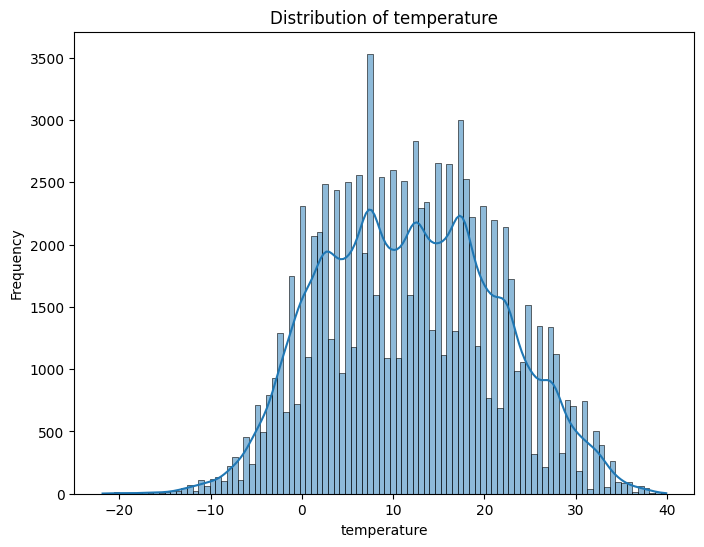

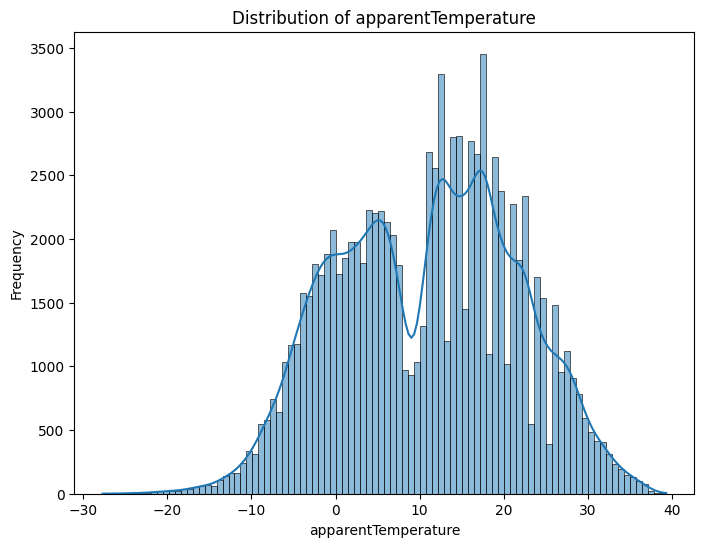

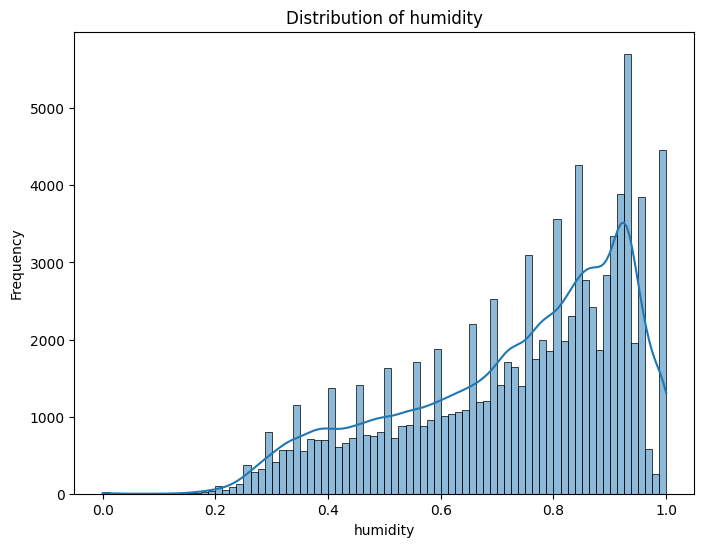

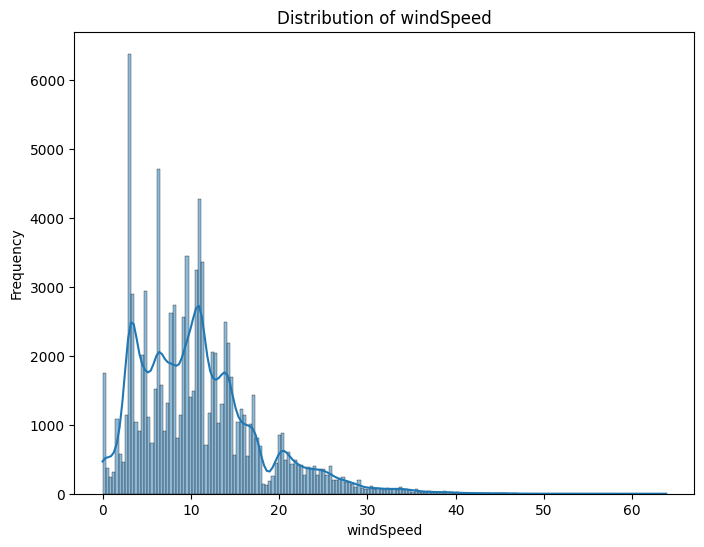

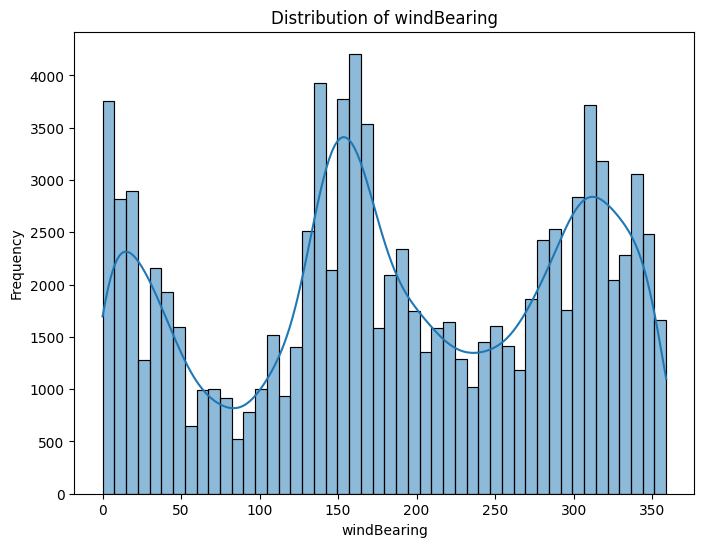

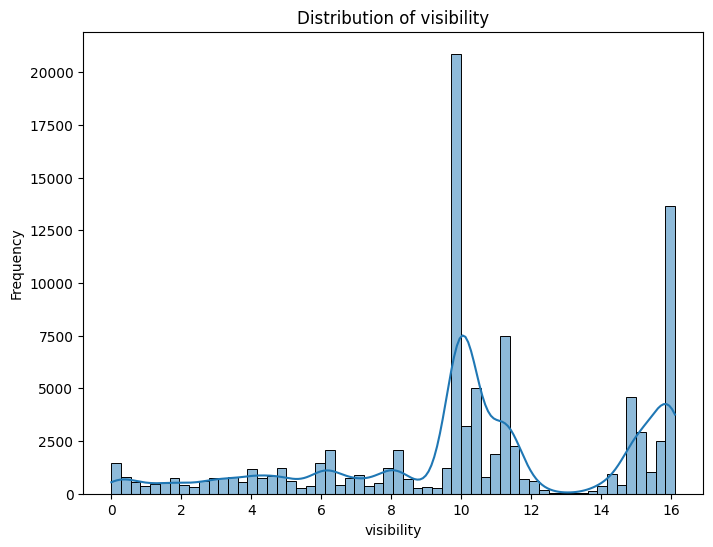

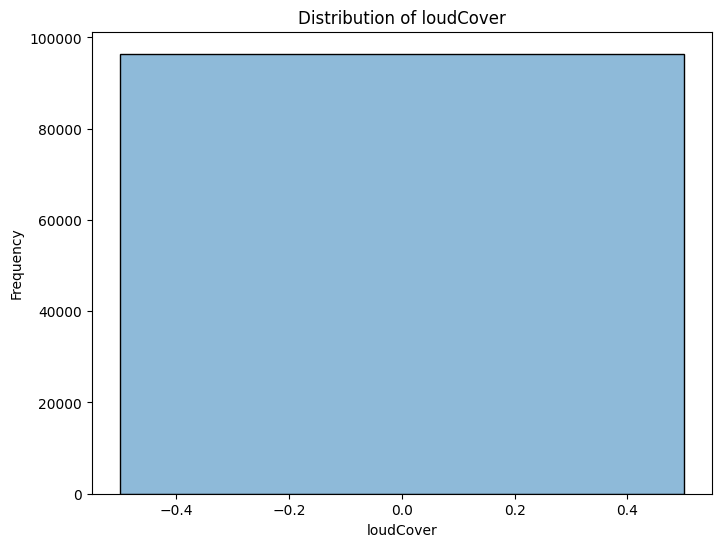

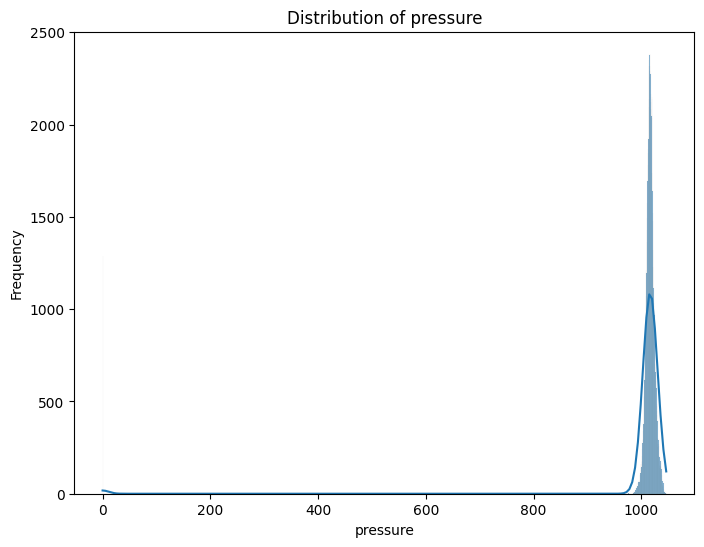

In [ ]:
# Histograms for numerical columns
for col in numerical_columns:
    plt.figure(figsize=(8, 6))
    sns.histplot(data[col], kde=True)
    plt.title(f'Distribution of {col}')
    plt.xlabel(col)
    plt.ylabel('Frequency')
    plt.show()

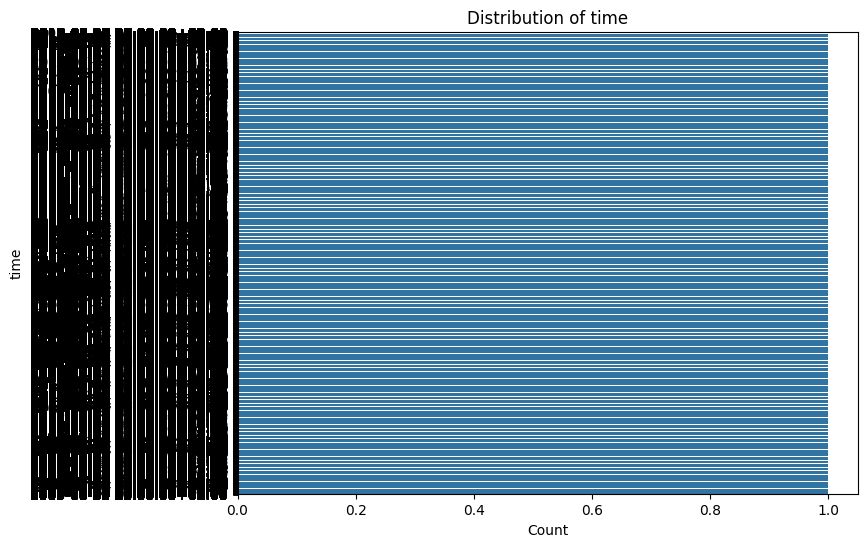

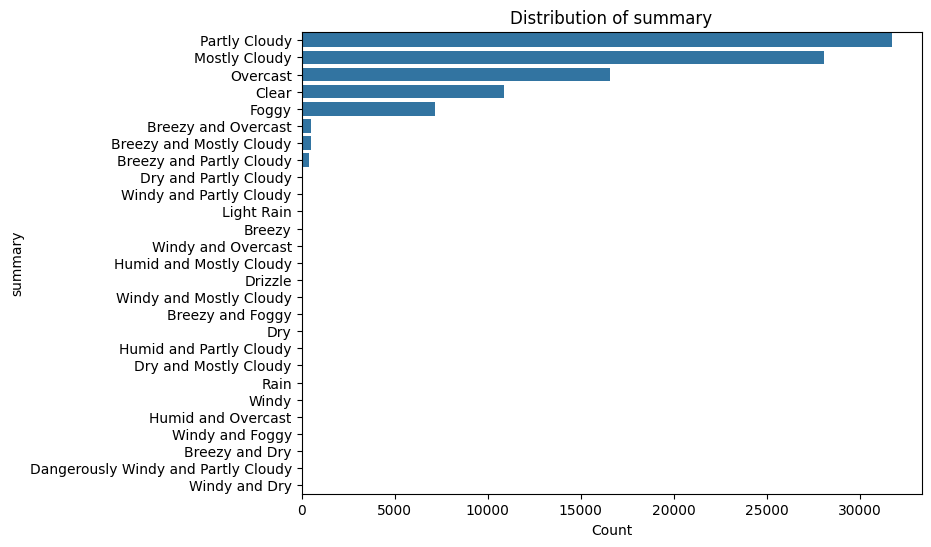

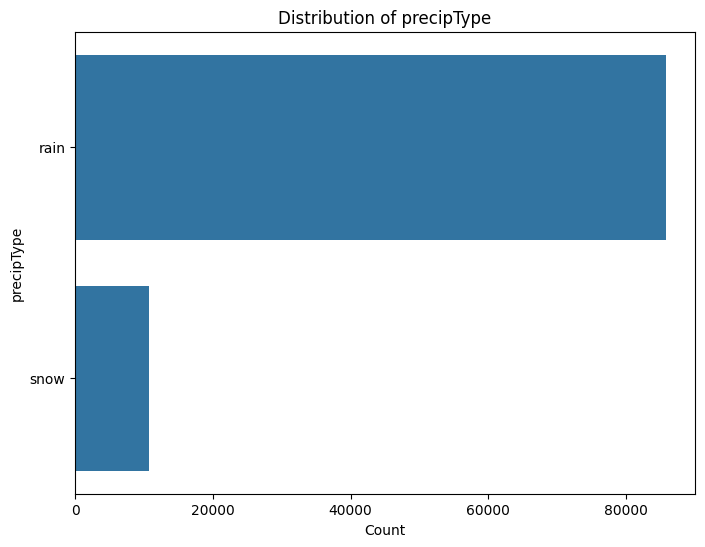

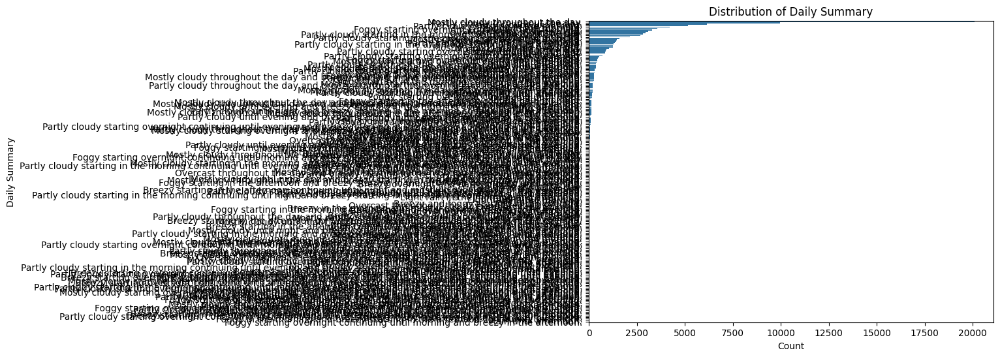

In [ ]:
# Bar plots for categorical columns
for col in categorical_columns:
    plt.figure(figsize=(8, 6))
    sns.countplot(y=data[col], order=data[col].value_counts().index)
    plt.title(f'Distribution of {col}')
    plt.xlabel('Count')
    plt.ylabel(col)
    plt.show()

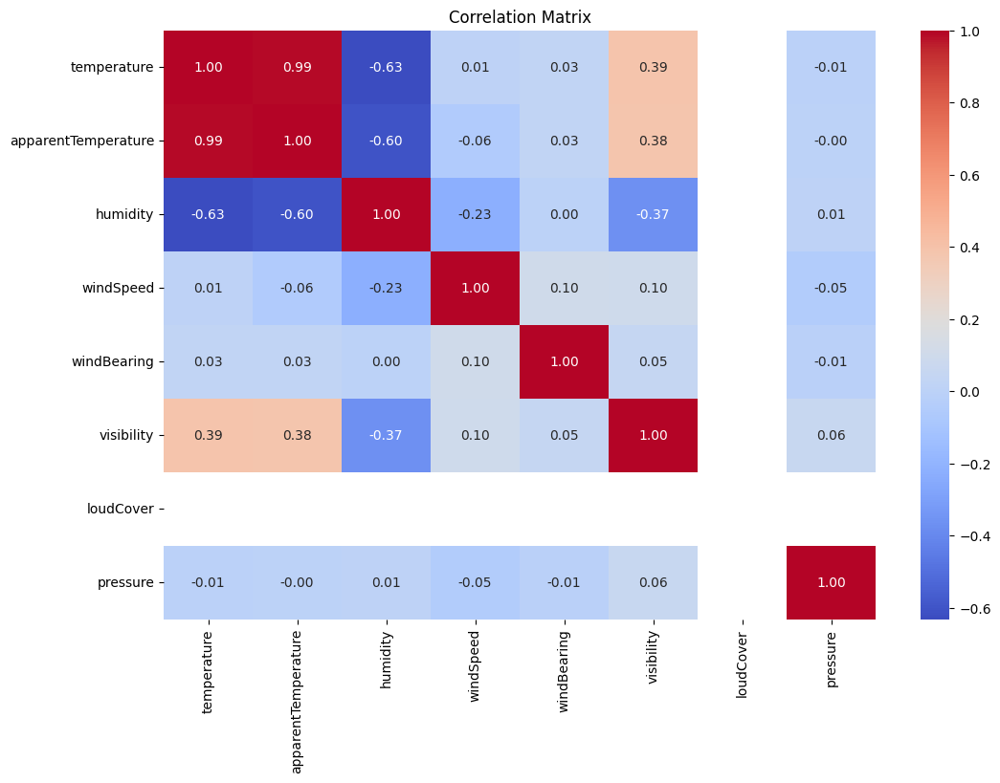

In [ ]:
# Correlation matrix
plt.figure(figsize=(12, 8))
corr_matrix = data[numerical_columns].corr()
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', fmt='.2f')
plt.title('Correlation Matrix')
plt.show()

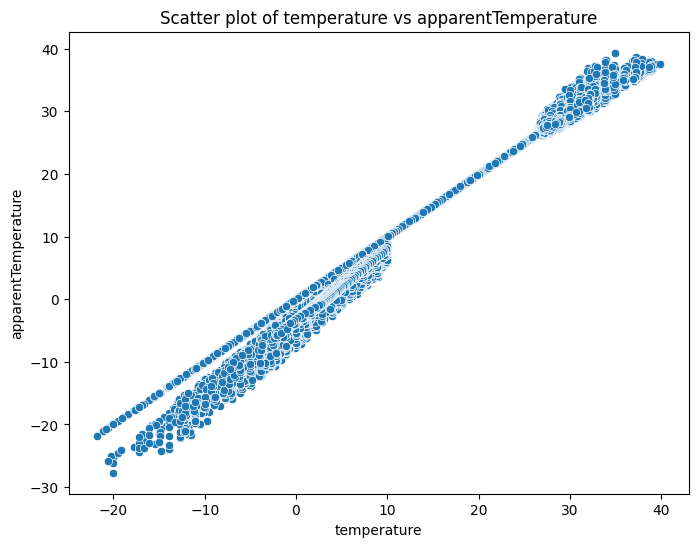

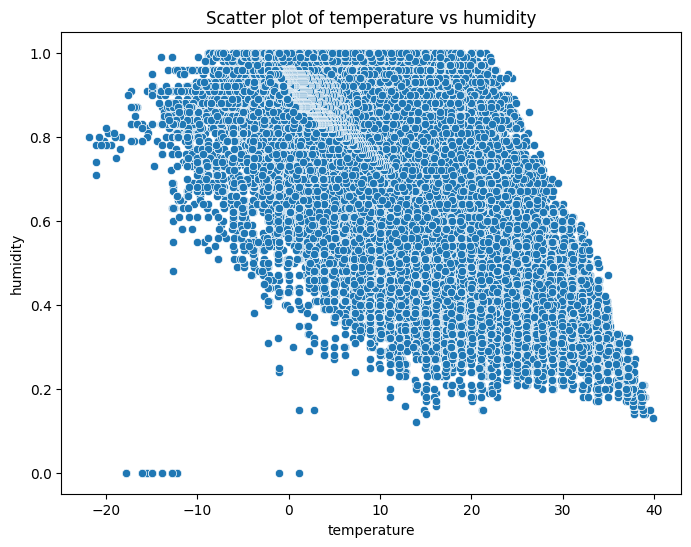

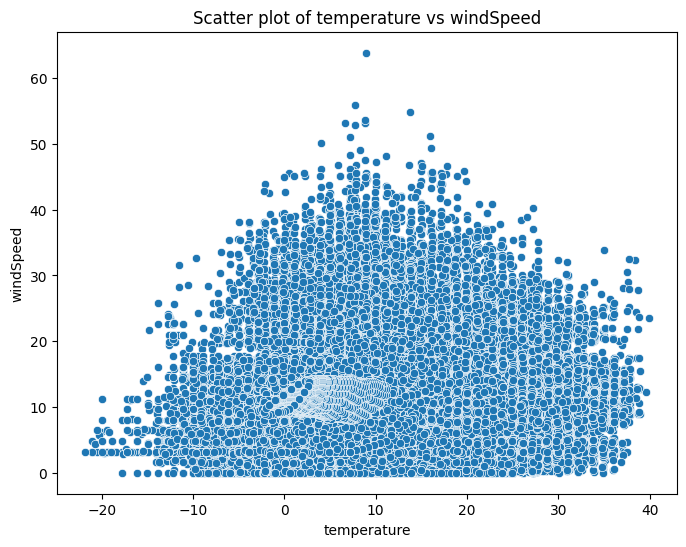

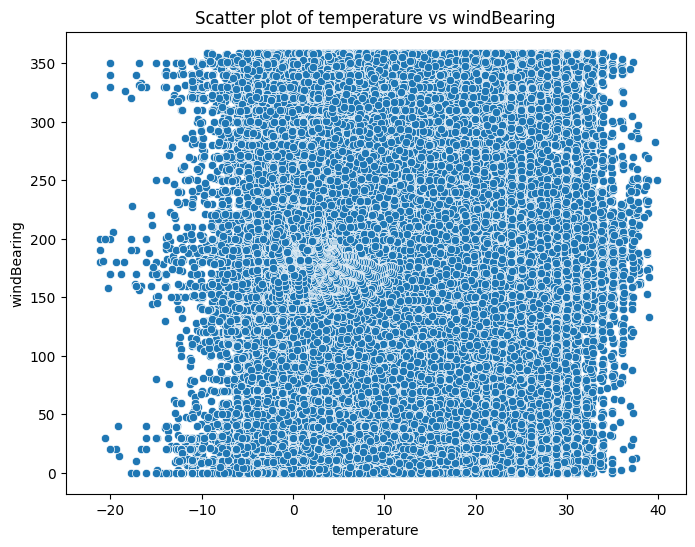

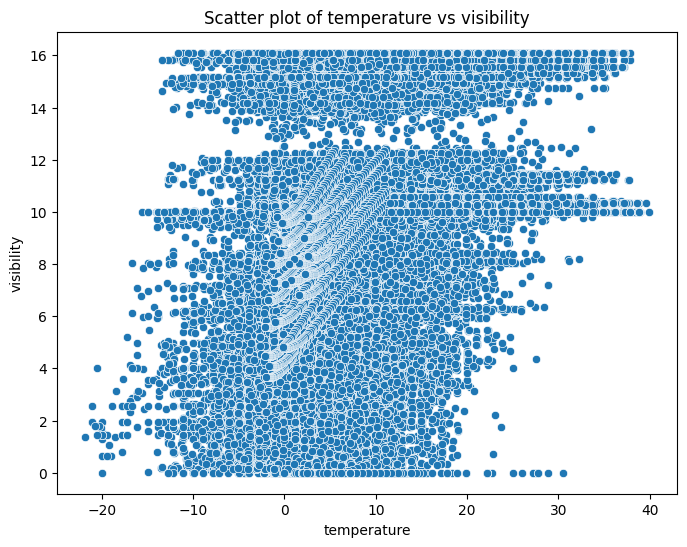

...

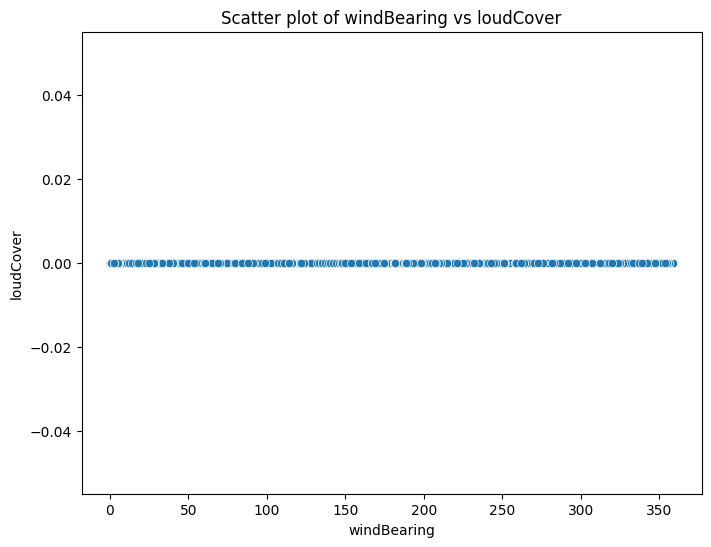

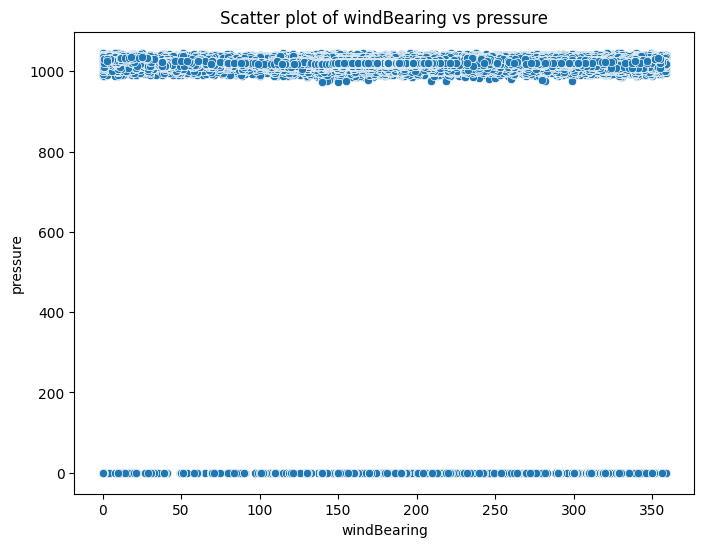

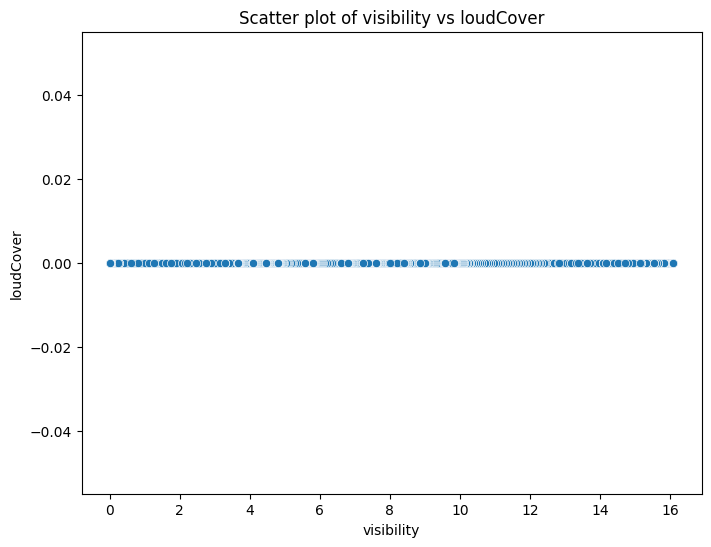

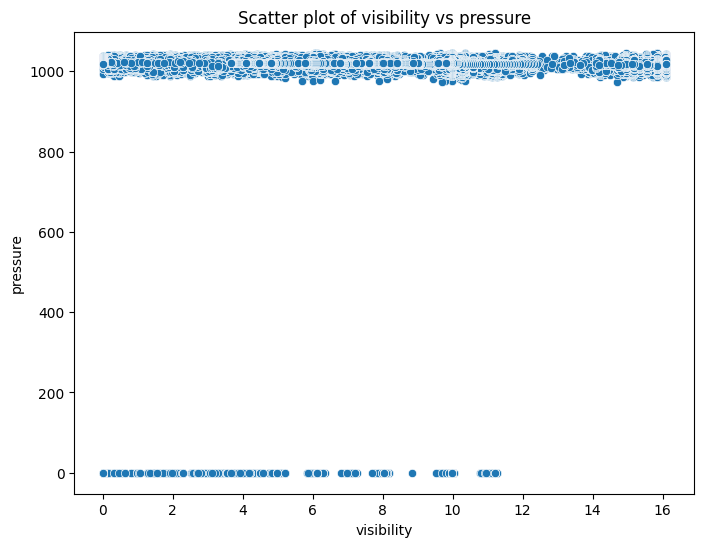

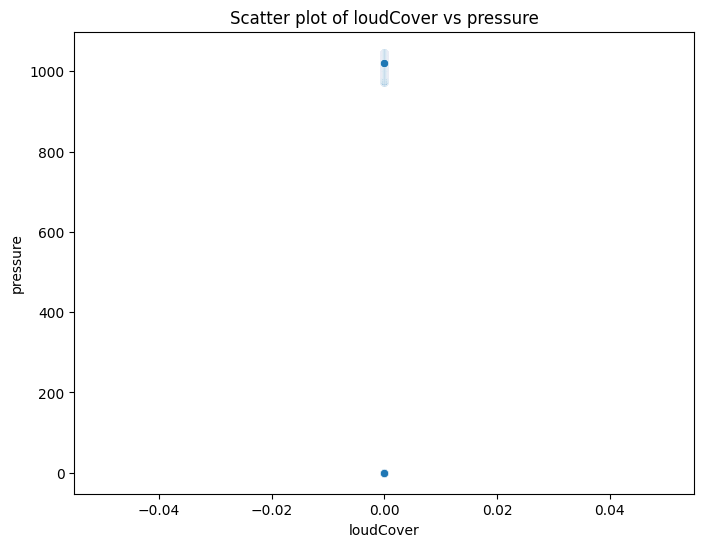

In [ ]:
# Scatter plots for numerical columns
for i in range(len(numerical_columns)):
    for j in range(i + 1, len(numerical_columns)):
        plt.figure(figsize=(8, 6))
        sns.scatterplot(x=data[numerical_columns[i]], y=data[numerical_columns[j]])
        plt.title(f'Scatter plot of {numerical_columns[i]} vs {numerical_columns[j]}')
        plt.xlabel(numerical_columns[i])
        plt.ylabel(numerical_columns[j])
        plt.show()

<ipython-input-25-50b091b041df>:4: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(data[col], shade=True)


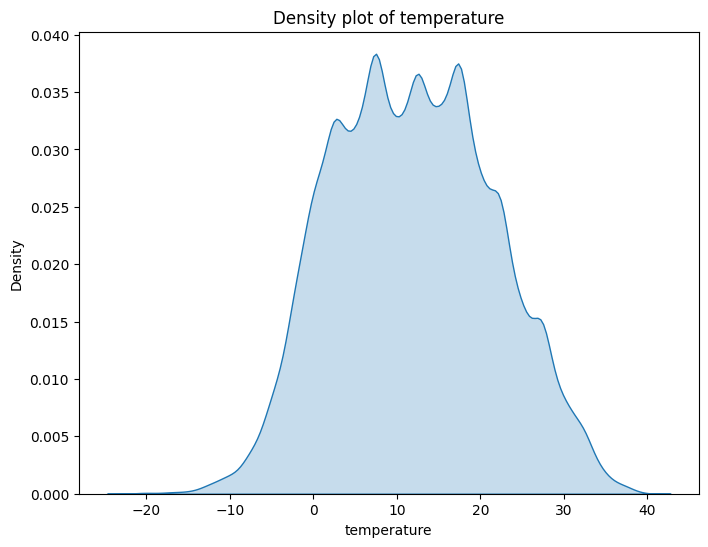

<ipython-input-25-50b091b041df>:4: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(data[col], shade=True)


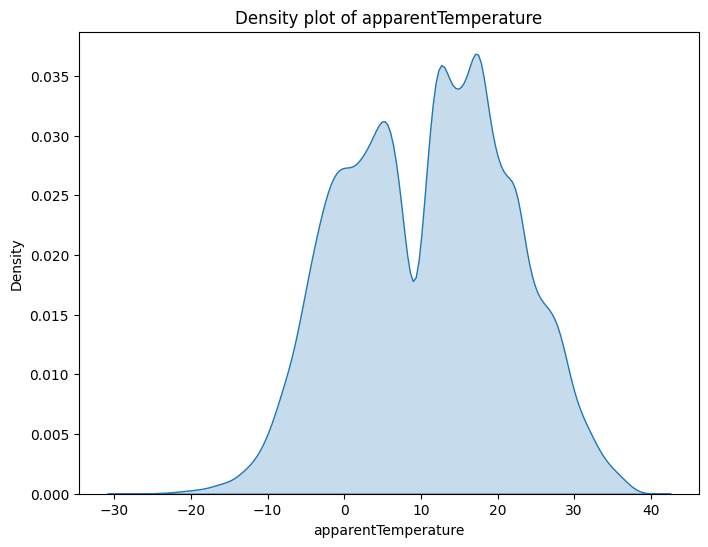

<ipython-input-25-50b091b041df>:4: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(data[col], shade=True)


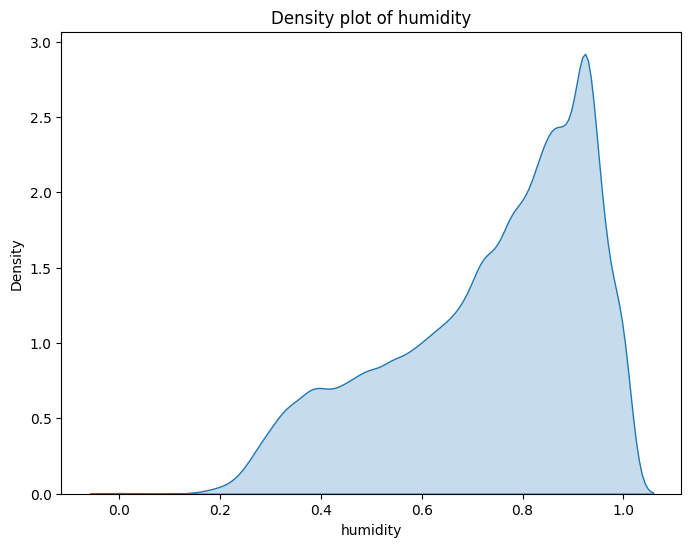

<ipython-input-25-50b091b041df>:4: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(data[col], shade=True)


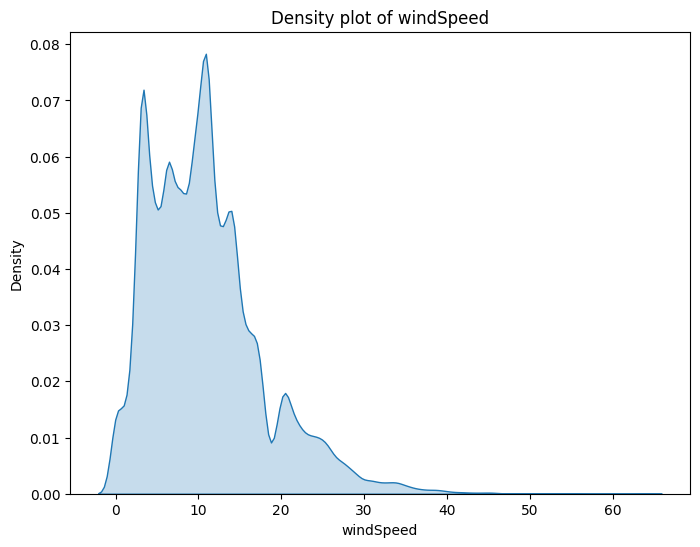

<ipython-input-25-50b091b041df>:4: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(data[col], shade=True)


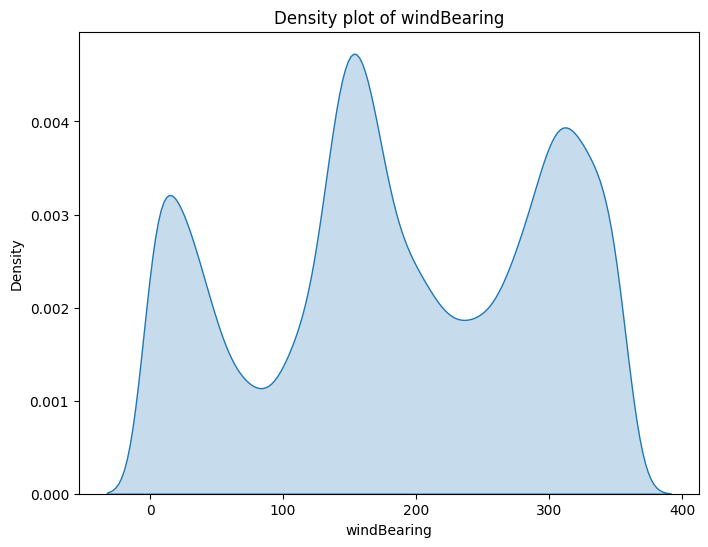

<ipython-input-25-50b091b041df>:4: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(data[col], shade=True)


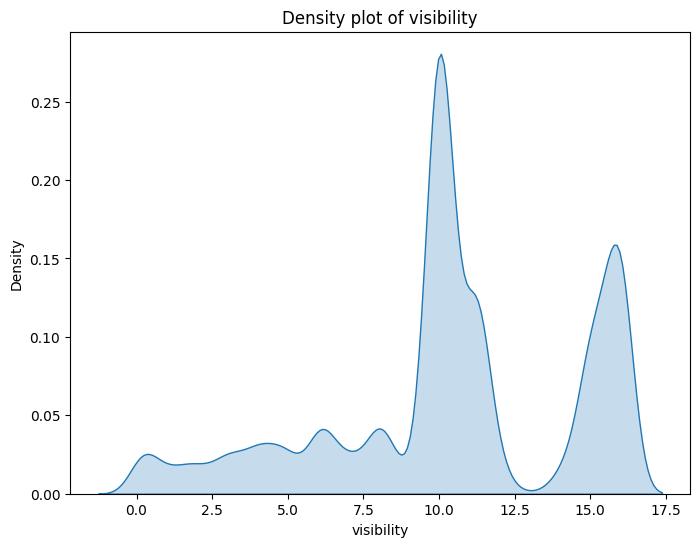

<ipython-input-25-50b091b041df>:4: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(data[col], shade=True)
<ipython-input-25-50b091b041df>:4: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(data[col], shade=True)


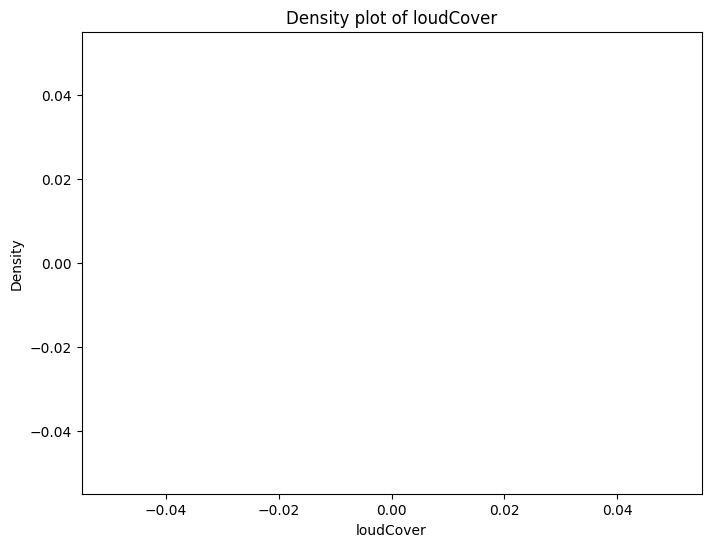

<ipython-input-25-50b091b041df>:4: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(data[col], shade=True)


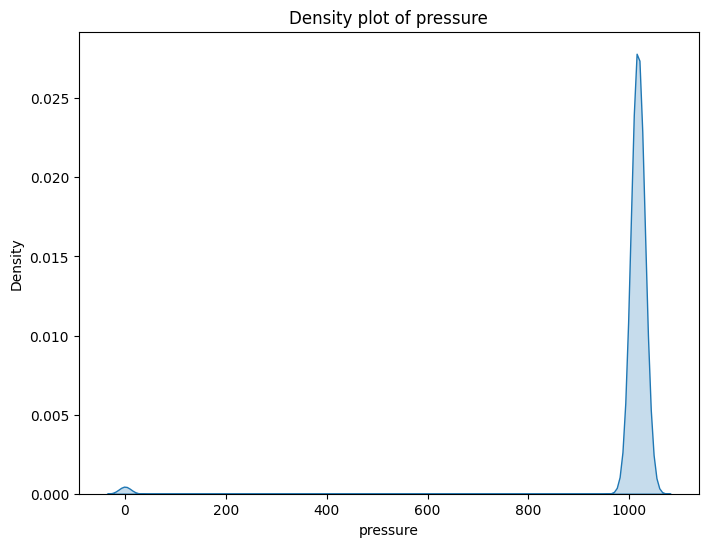

In [ ]:
# Density plots for numerical columns
for col in numerical_columns:
    plt.figure(figsize=(8, 6))
    sns.kdeplot(data[col], shade=True)
    plt.title(f'Density plot of {col}')
    plt.xlabel(col)
    plt.ylabel('Density')
    plt.show()

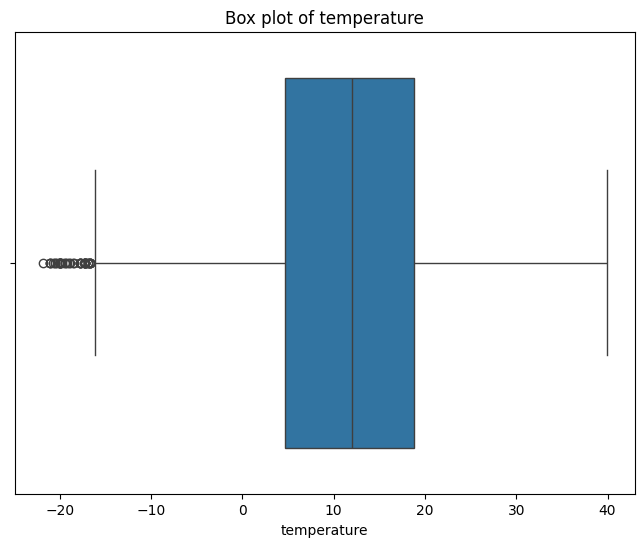

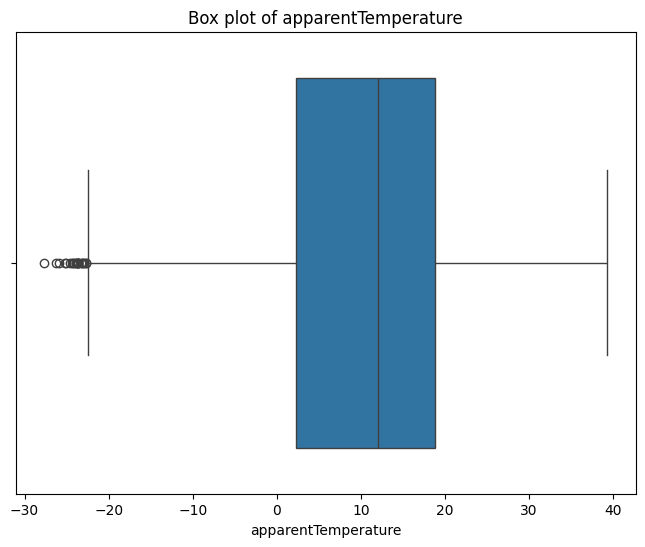

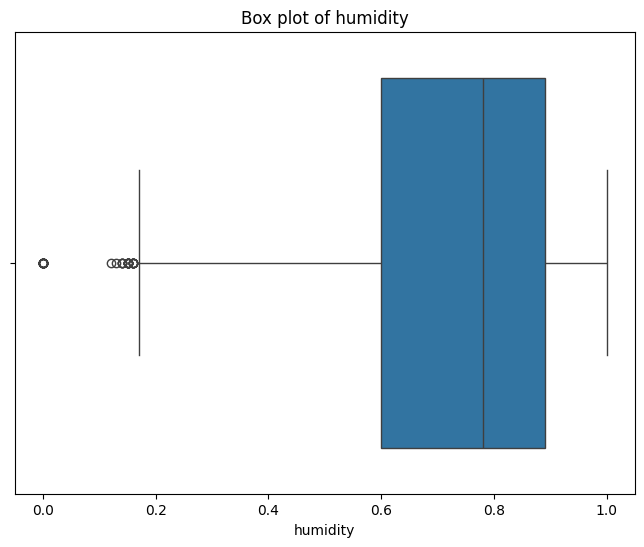

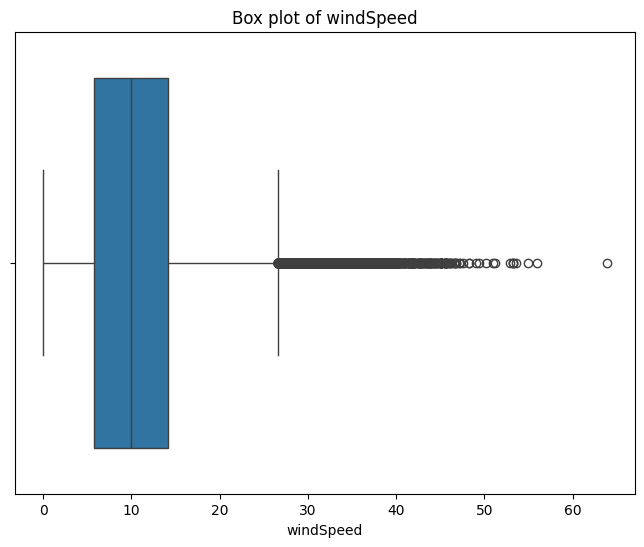

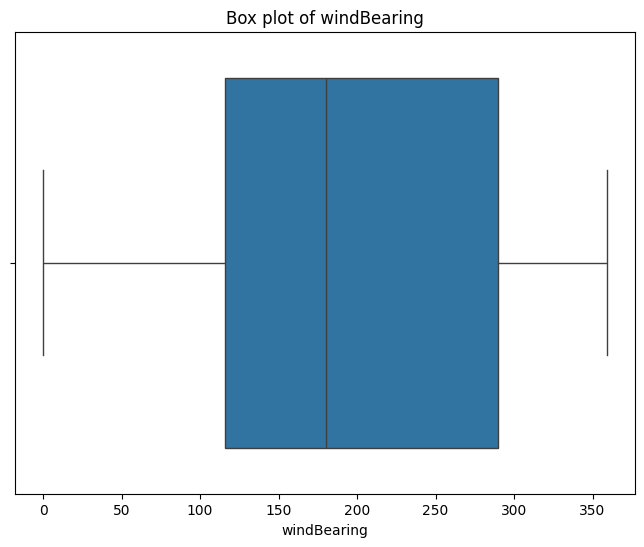

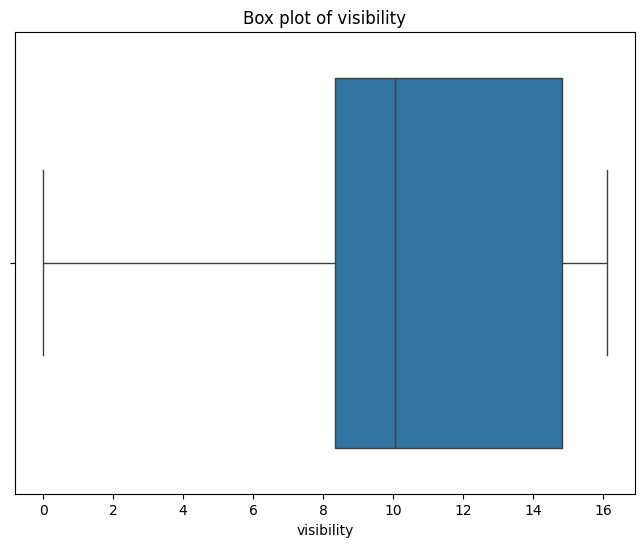

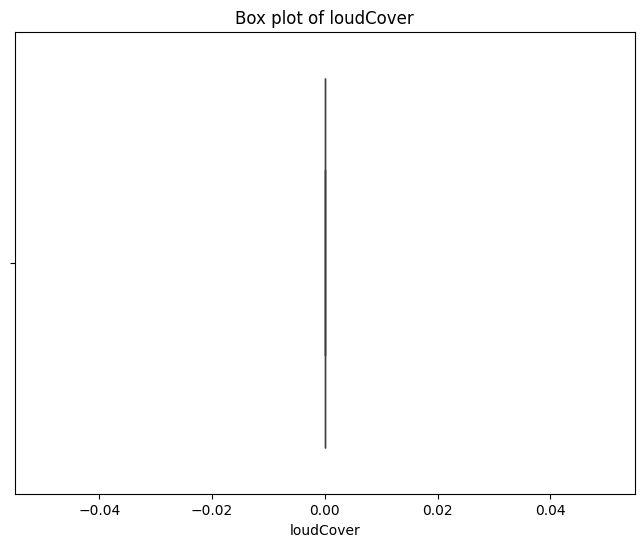

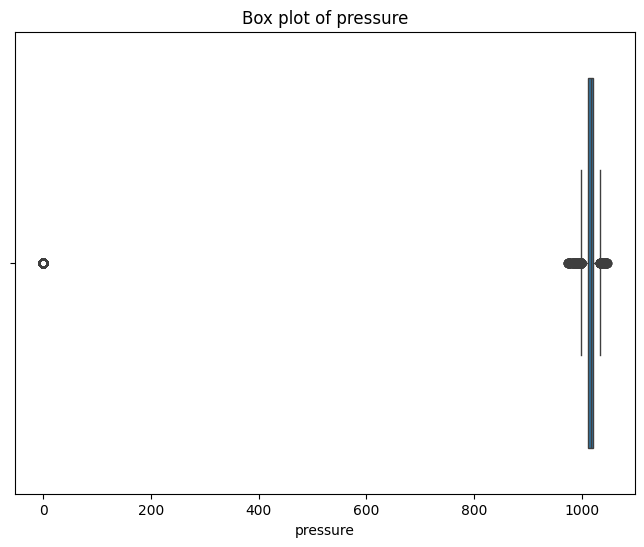

In [ ]:
# Box plots for numerical columns
for col in numerical_columns:
    plt.figure(figsize=(8, 6))
    sns.boxplot(x=data[col])
    plt.title(f'Box plot of {col}')
    plt.xlabel(col)
    plt.show()

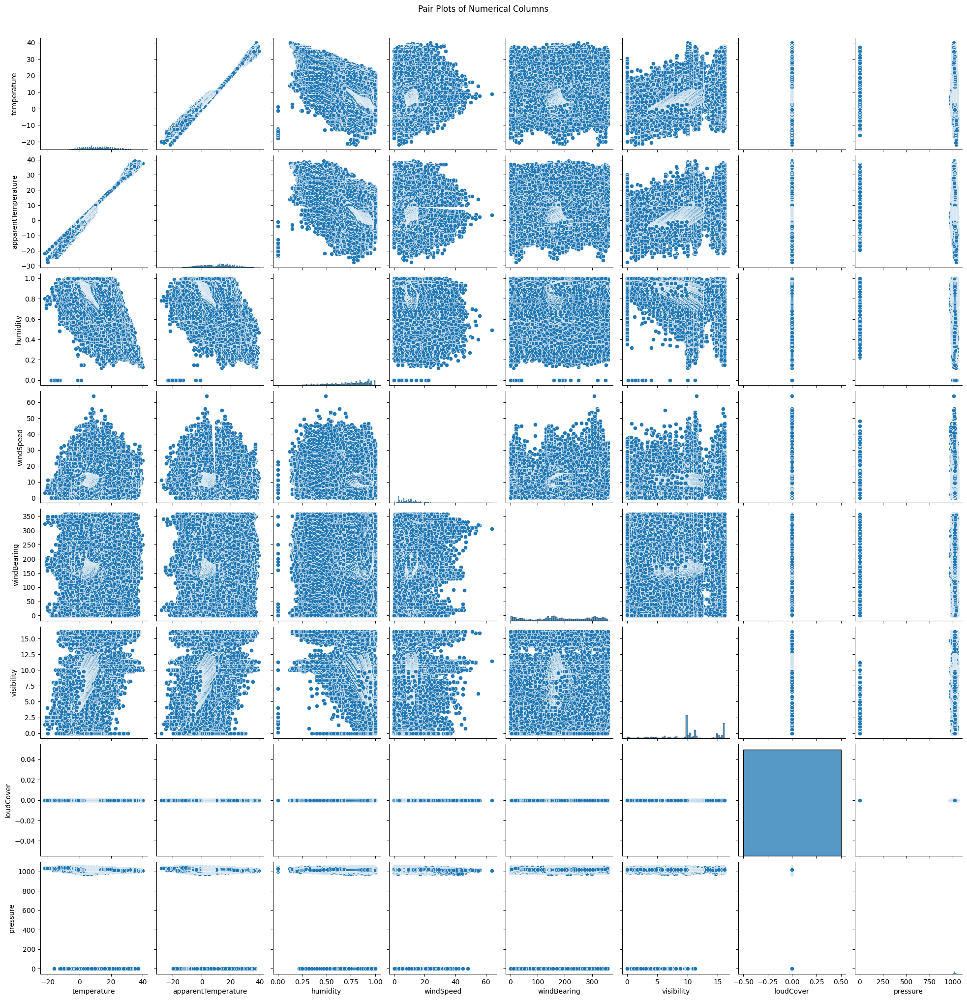

In [ ]:
# Pair plots for numerical columns
sns.pairplot(data[numerical_columns])
plt.suptitle('Pair Plots of Numerical Columns', y=1.02)
plt.show()

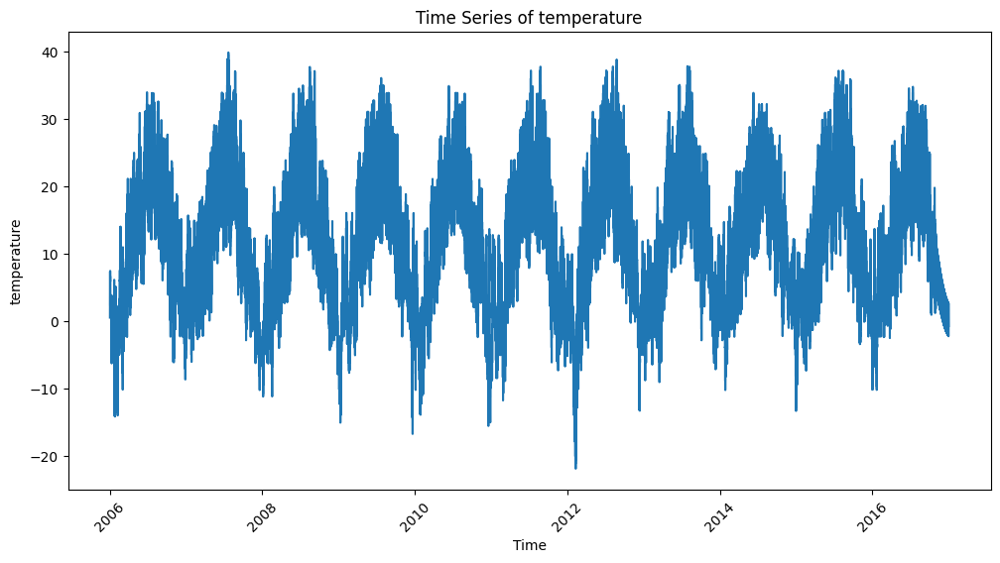

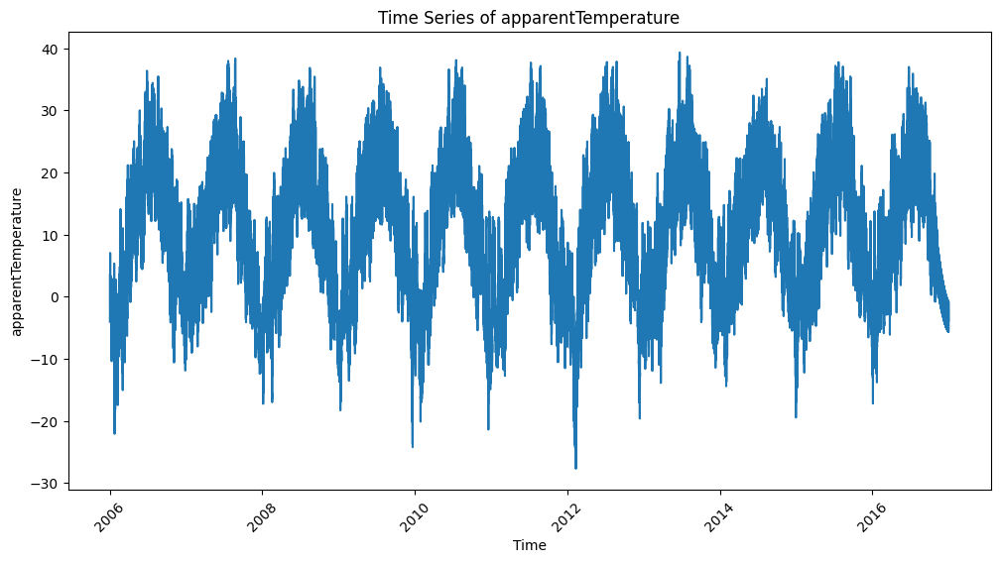

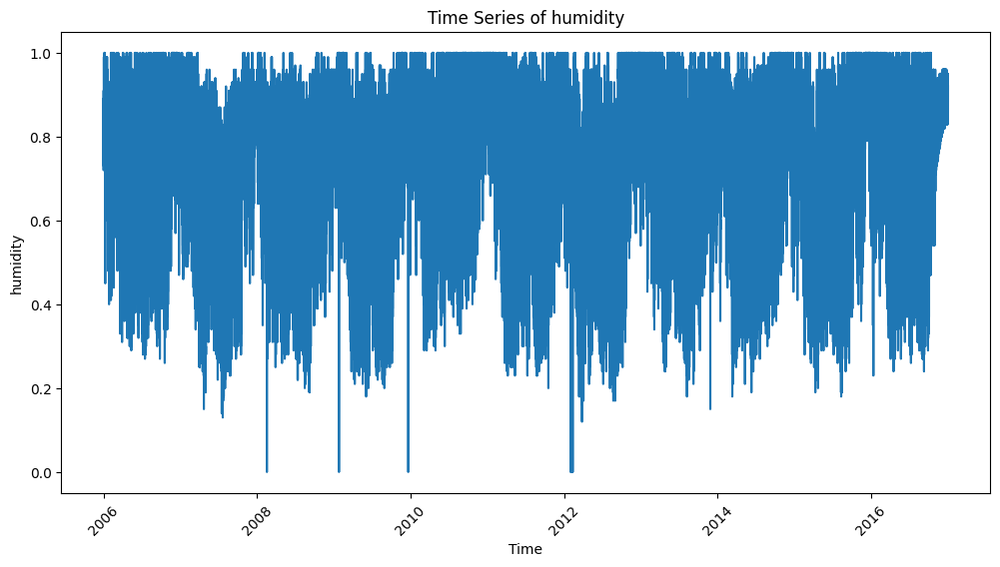

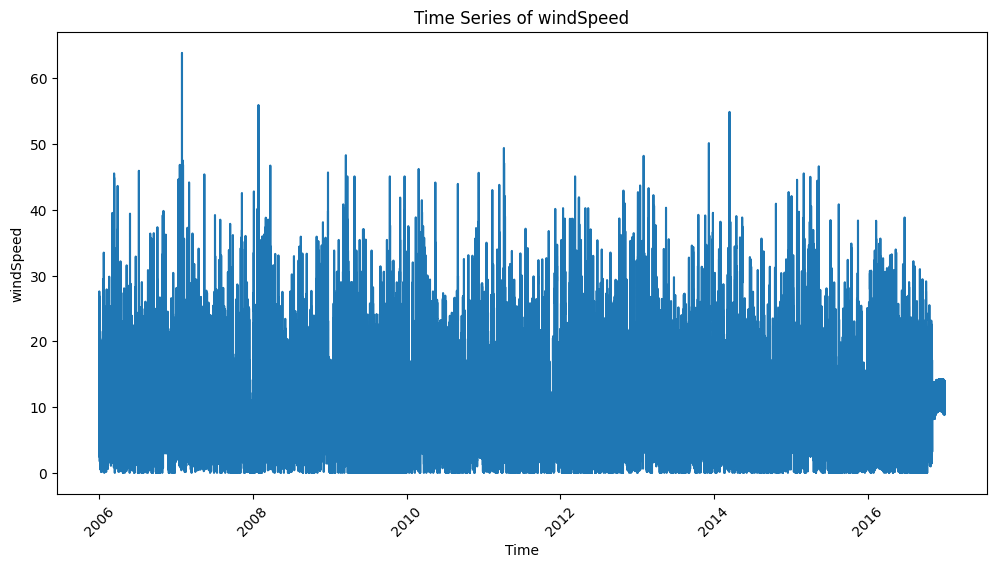

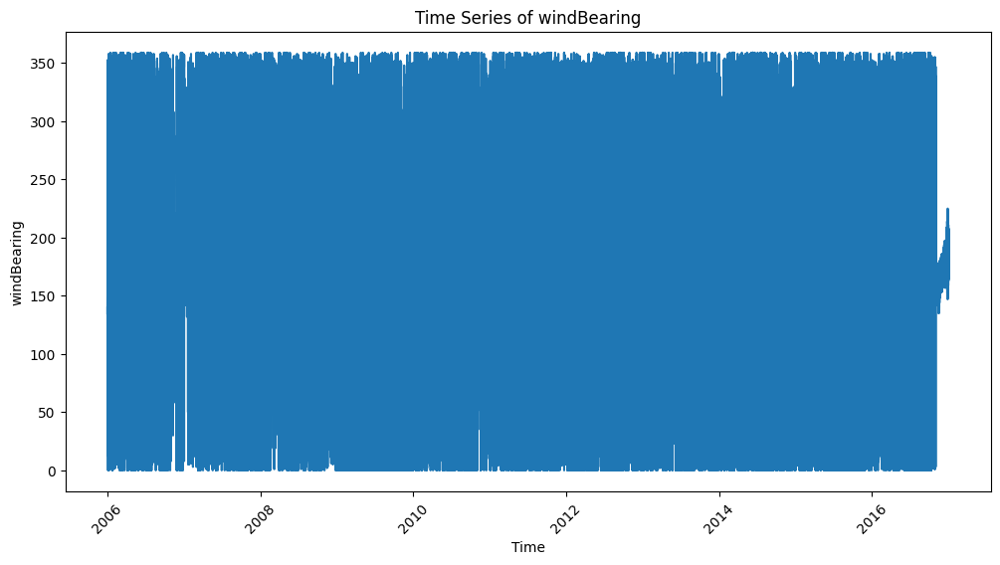

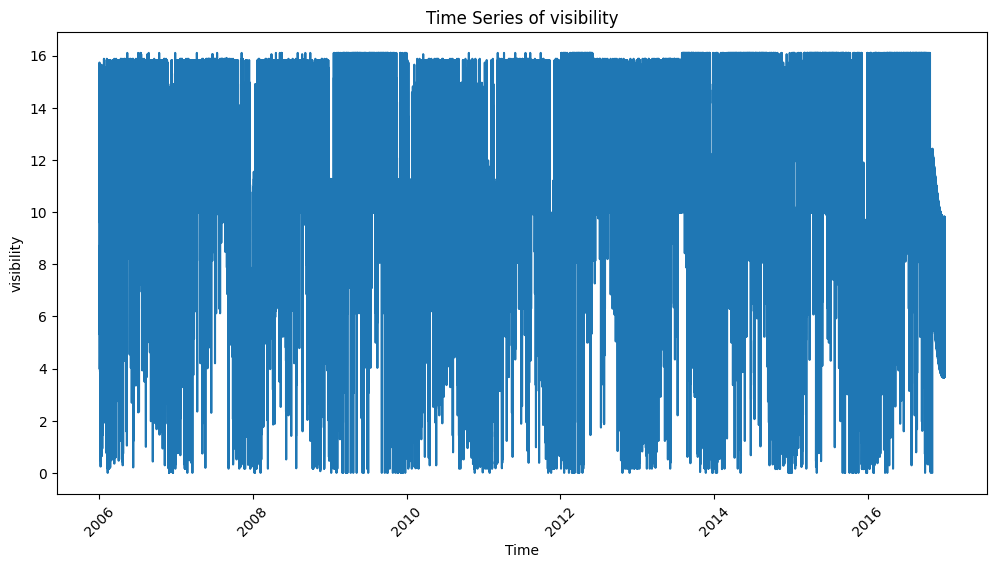

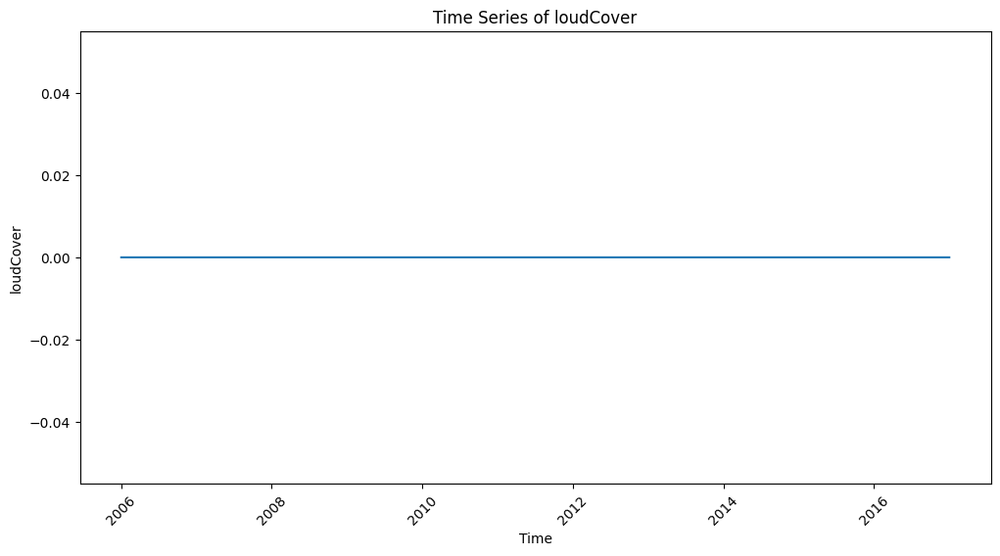

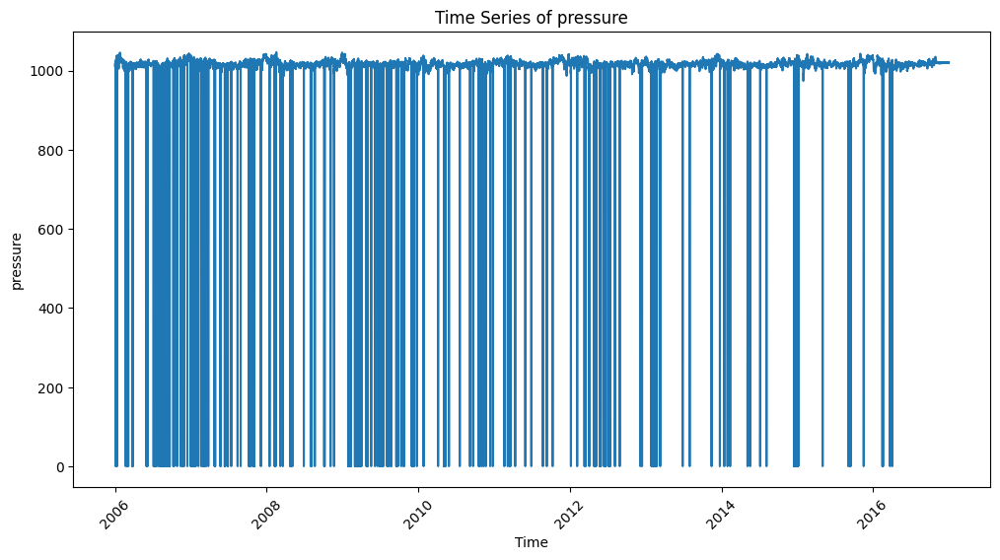

In [ ]:
# Time series analysis
# Plotting time series for numerical columns
for col in numerical_columns:
    plt.figure(figsize=(12, 6))
    sns.lineplot(x=data['time'], y=data[col])
    plt.title(f'Time Series of {col}')
    plt.xlabel('Time')
    plt.ylabel(col)
    plt.xticks(rotation=45)
    plt.show()

In [ ]:
# Outlier detection using Z-score
from scipy.stats import zscore

data_zscore = data[numerical_columns].apply(zscore)
outliers = (data_zscore.abs() > 3).any(axis=1)
print("\nNumber of outliers detected using Z-score:")
print(outliers.sum())


Number of outliers detected using Z-score:
2538


In [ ]:
# Additional EDA: Categorical column analysis
for col in categorical_columns:
    print(f"\nValue counts for {col}:")
    print(data[col].value_counts())


Value counts for time:
time
2006-01-01 00:00:00+01:00    1
2013-05-02 11:00:00+02:00    1
2013-05-02 20:00:00+02:00    1
2013-05-02 19:00:00+02:00    1
2013-05-02 18:00:00+02:00    1
                            ..
2009-09-01 07:00:00+02:00    1
2009-09-01 06:00:00+02:00    1
2009-09-01 05:00:00+02:00    1
2009-09-01 04:00:00+02:00    1
2016-12-31 23:00:00+01:00    1
Name: count, Length: 96428, dtype: int64

Value counts for summary:
summary
Partly Cloudy                          31725
Mostly Cloudy                          28094
Overcast                               16597
Clear                                  10873
Foggy                                   7148
Breezy and Overcast                      528
Breezy and Mostly Cloudy                 516
Breezy and Partly Cloudy                 386
Dry and Partly Cloudy                     86
Windy and Partly Cloudy                   67
Light Rain                                63
Breezy                                    54
Windy and Over

In [ ]:
# Additional EDA: Pivot tables
pivot_table = data.pivot_table(index='Daily Summary', values=numerical_columns, aggfunc=np.mean)
print("\nPivot Table:")
print(pivot_table)


Pivot Table:
                                                 apparentTemperature  \
Daily Summary                                                          
Breezy and foggy starting in the evening.                   0.485880   
Breezy and foggy until morning.                           -10.947222   
Breezy and mostly cloudy overnight.                        -0.340741   
Breezy and partly cloudy in the afternoon.                 27.488657   
Breezy in the morning and foggy in the evening.            -5.121528   
...                                                              ...   
Partly cloudy until night.                                 17.282404   
Rain throughout the day.                                    9.285880   
Rain until afternoon.                                      11.328009   
Rain until morning.                                         8.253009   
Windy in the afternoon.                                     1.004167   

                                                 

<ipython-input-31-f92434bbe2c6>:2: FutureWarning: The provided callable <function mean at 0x7c35d4db1080> is currently using DataFrameGroupBy.mean. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass the string "mean" instead.
  pivot_table = data.pivot_table(index='Daily Summary', values=numerical_columns, aggfunc=np.mean)


Now let's move to data modeling and building : Regression Analysis

We'll try different models and proceed with the best one using a variety of techniques

Remark : we will not use our categorical data as predictive variables as they're just descriptive attributes.

Let's try and see if we can predict temperature based on the variables we have. For that, we will try the random forest method and correlation matrix to see if there are variables highly correlated with it.

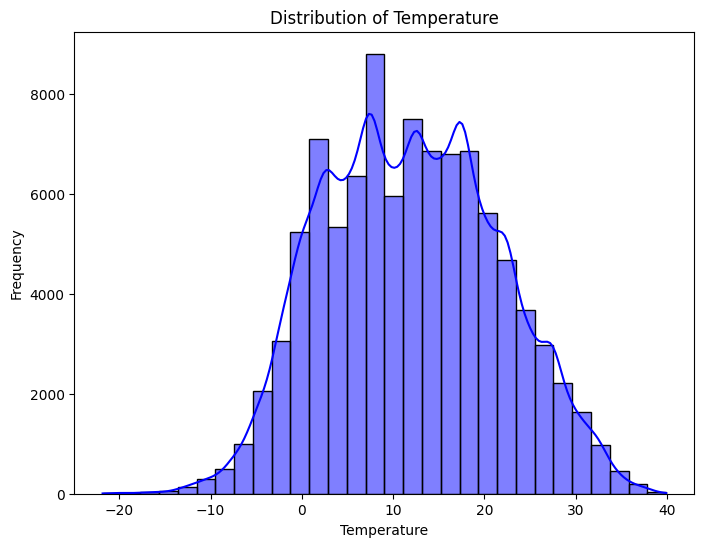

In [ ]:
# Visualizing the target variable (Temperature)
plt.figure(figsize=(8, 6))
sns.histplot(data['temperature'], kde=True, bins=30, color='blue')
plt.title('Distribution of Temperature')
plt.xlabel('Temperature')
plt.ylabel('Frequency')
plt.show()

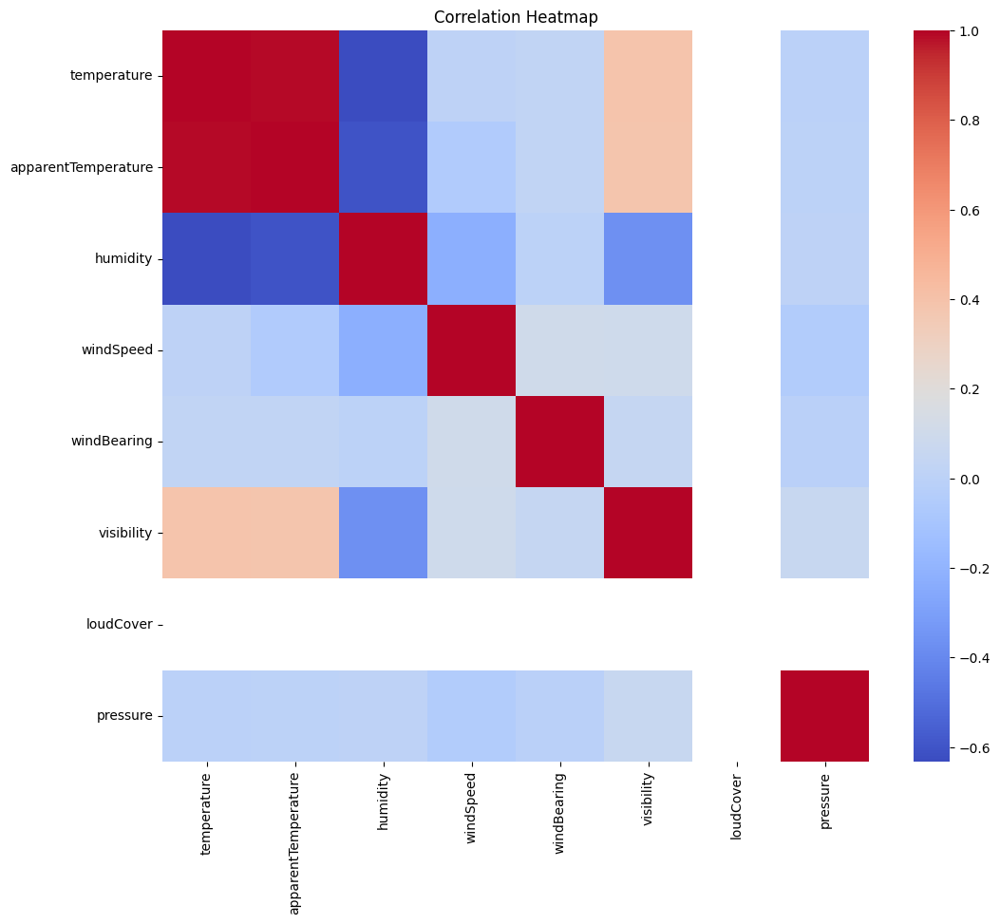

In [ ]:
# Correlation heatmap
plt.figure(figsize=(12, 10))
# Calculate correlation only for numerical features
correlation_matrix = data.select_dtypes(include=np.number).corr()
sns.heatmap(correlation_matrix, cmap='coolwarm', annot=False, fmt=".2f")
plt.title("Correlation Heatmap")
plt.show()

Random Forest Test MSE: 0.00241719844257908
Random Forest Test R2: 0.9999734777367348


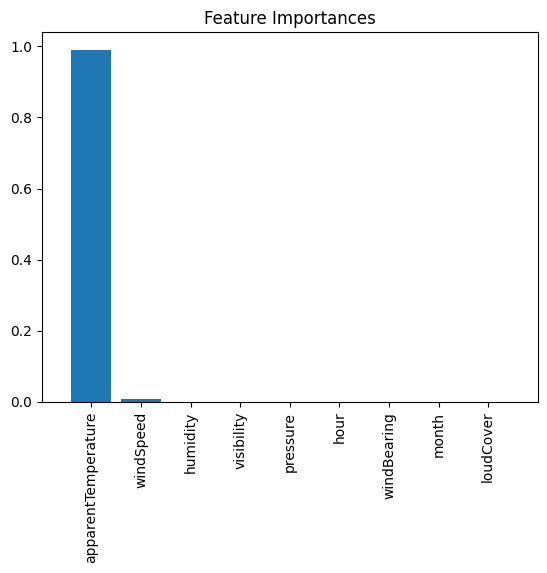

In [ ]:
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error, r2_score
import matplotlib.pyplot as plt

# Feature Engineering
# let's include derived additional time features !
data['time'] = pd.to_datetime(data['time'], utc=True)
data['hour'] = data['time'].dt.hour
data['month'] = data['time'].dt.month



features = ['apparentTemperature', 'humidity','windSpeed', 'windBearing', 'visibility', 'loudCover', 'pressure', 'hour', 'month']

X = data[features]
y = data['temperature']

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Scale the features
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Initialize and train the Random Forest Regressor
rf_model = RandomForestRegressor(n_estimators=100, random_state=42)  # You can tune n_estimators and other parameters
rf_model.fit(X_train_scaled, y_train)

# Make predictions
y_pred_test = rf_model.predict(X_test_scaled)

# Evaluate the model
test_mse = mean_squared_error(y_test, y_pred_test)
test_r2 = r2_score(y_test, y_pred_test)

print(f'Random Forest Test MSE: {test_mse}')
print(f'Random Forest Test R2: {test_r2}')

# Optional: Visualize the feature importances
importances = rf_model.feature_importances_
indices = np.argsort(importances)[::-1]

plt.figure()
plt.title('Feature Importances')
plt.bar(range(X.shape[1]), importances[indices], align='center')
plt.xticks(range(X.shape[1]), np.array(features)[indices], rotation=90)
plt.xlim([-1, X.shape[1]])
plt.show()

No obvious significant features affection temperature apart from apparentTemperature (which is obviously highly correlated with the actual temperature) so let's try out a different dependent variable

From the correlation matrix we can notice that humidity and visibility are the best choices, let's compare between them.

We will try out humidity

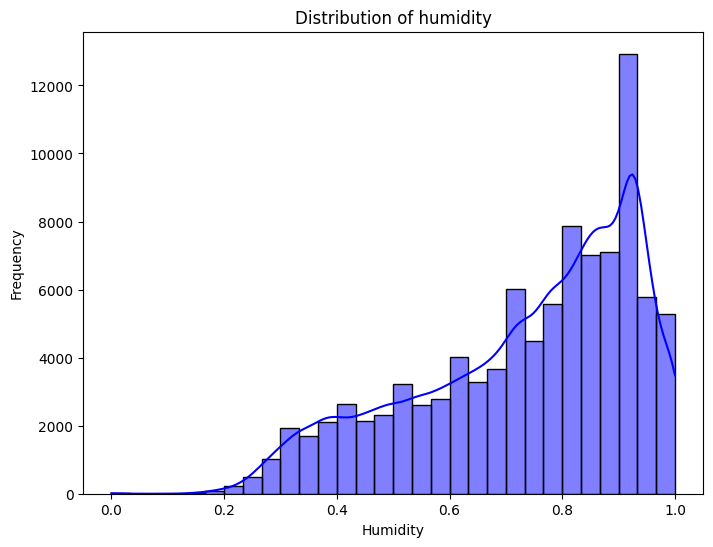

In [ ]:
# Visualizing the target variable (humidity)
plt.figure(figsize=(8, 6))
sns.histplot(data['humidity'], kde=True, bins=30, color='blue')
plt.title('Distribution of humidity')
plt.xlabel('Humidity')
plt.ylabel('Frequency')
plt.show()

Random Forest Test MSE: 0.006001132786477237
Random Forest Test R2: 0.8433338398943988


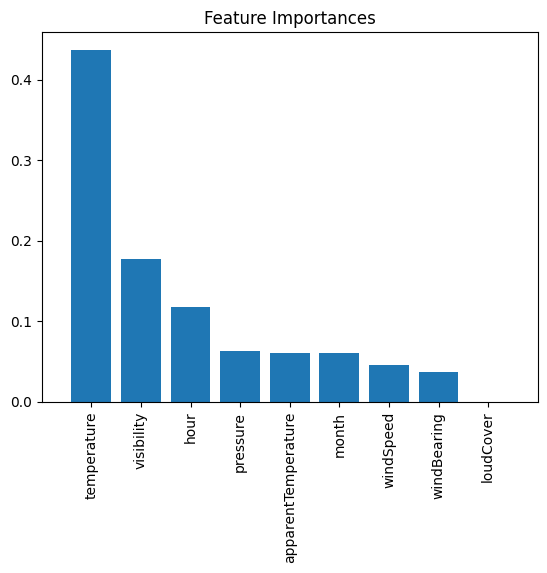

In [ ]:
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error, r2_score
import matplotlib.pyplot as plt

# Feature Engineering
# let's include derived additional time features !
data['time'] = pd.to_datetime(data['time'], utc=True)
data['hour'] = data['time'].dt.hour
data['month'] = data['time'].dt.month


features = ['apparentTemperature', 'temperature','windSpeed', 'windBearing', 'visibility', 'loudCover', 'pressure', 'hour', 'month']

X = data[features]
y = data['humidity']

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Scale the features
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Initialize and train the Random Forest Regressor
rf_model = RandomForestRegressor(n_estimators=100, random_state=42)  # You can tune n_estimators and other parameters
rf_model.fit(X_train_scaled, y_train)

# Make predictions
y_pred_test = rf_model.predict(X_test_scaled)

# Evaluate the model
test_mse = mean_squared_error(y_test, y_pred_test)
test_r2 = r2_score(y_test, y_pred_test)

print(f'Random Forest Test MSE: {test_mse}')
print(f'Random Forest Test R2: {test_r2}')

# Optional: Visualize the feature importances
importances = rf_model.feature_importances_
indices = np.argsort(importances)[::-1]

plt.figure()
plt.title('Feature Importances')
plt.bar(range(X.shape[1]), importances[indices], align='center')
plt.xticks(range(X.shape[1]), np.array(features)[indices], rotation=90)
plt.xlim([-1, X.shape[1]])
plt.show()

Now visbility

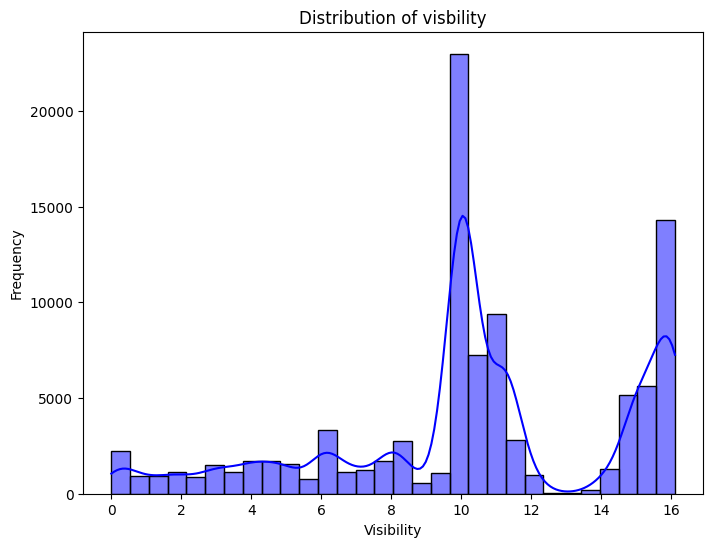

In [ ]:
# Visualizing the target variable (humidity)
plt.figure(figsize=(8, 6))
sns.histplot(data['visibility'], kde=True, bins=30, color='blue')
plt.title('Distribution of visbility')
plt.xlabel('Visibility')
plt.ylabel('Frequency')
plt.show()

Random Forest Test MSE: 6.090026218678565
Random Forest Test R2: 0.6473711815623022


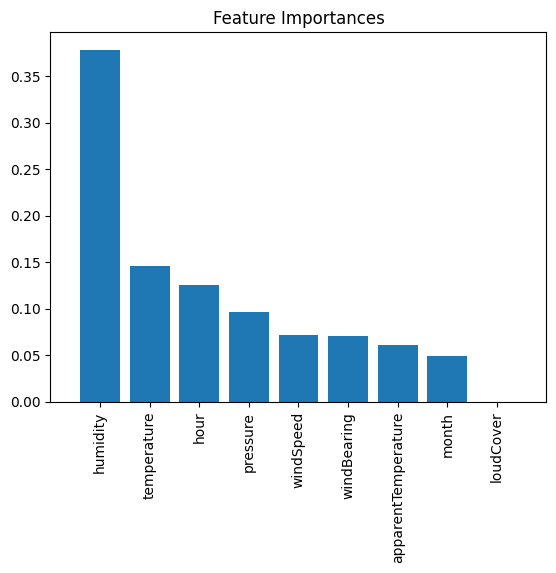

In [ ]:
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error, r2_score
import matplotlib.pyplot as plt

# Feature Engineering
# let's include derived additional time features !
data['time'] = pd.to_datetime(data['time'], utc=True)
data['hour'] = data['time'].dt.hour
data['month'] = data['time'].dt.month


features = ['apparentTemperature', 'temperature','windSpeed', 'windBearing', 'humidity', 'loudCover', 'pressure', 'hour', 'month']


X = data[features]
y = data['visibility']

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Scale the features
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Initialize and train the Random Forest Regressor
rf_model = RandomForestRegressor(n_estimators=100, random_state=42)  # You can tune n_estimators and other parameters
rf_model.fit(X_train_scaled, y_train)

# Make predictions
y_pred_test = rf_model.predict(X_test_scaled)

# Evaluate the model
test_mse = mean_squared_error(y_test, y_pred_test)
test_r2 = r2_score(y_test, y_pred_test)

print(f'Random Forest Test MSE: {test_mse}')
print(f'Random Forest Test R2: {test_r2}')

# Optional: Visualize the feature importances
importances = rf_model.feature_importances_
indices = np.argsort(importances)[::-1]

plt.figure()
plt.title('Feature Importances')
plt.bar(range(X.shape[1]), importances[indices], align='center')
plt.xticks(range(X.shape[1]), np.array(features)[indices], rotation=90)
plt.xlim([-1, X.shape[1]])
plt.show()

We notice that humidity is the best choice as a dependent variable as it got the highest number of potentially good predictors. We will proceed with it for our model building !

In [ ]:
data['loudCover'].unique()

array([0.])

Since loudCover is a constant variable, it won't contribute any useful information to the regression model. We should remove it from the analysis, both from the VIF calculation and from the model features.

First, let's check for highly correlated variables using VIFs and eliminate highly correlated variables to make our choice easier.

In [ ]:
from statsmodels.stats.outliers_influence import variance_inflation_factor
vif = pd.DataFrame()
# Select only numerical features for VIF calculation
numerical_features = data.select_dtypes(include=np.number).columns
vif["Variable"] = numerical_features

# Calculate VIF for numerical features only
vif["VIF"] = [variance_inflation_factor(data[numerical_features].values, i)
              for i in range(len(numerical_features))]
print(vif)

/usr/local/lib/python3.11/dist-packages/statsmodels/regression/linear_model.py:1784: RuntimeWarning: invalid value encountered in scalar divide
  return 1 - self.ssr/self.uncentered_tss


              Variable         VIF
0          temperature  243.539528
1  apparentTemperature  191.753873
2             humidity   19.469197
3            windSpeed    4.999249
4          windBearing    4.081195
5           visibility    8.526652
6            loudCover         NaN
7             pressure   36.206426
8                 hour    3.730813
9                month    4.893296


In [ ]:
from statsmodels.stats.outliers_influence import variance_inflation_factor

def calculate_vif(df, features):
    """Calculates VIF for specified features in a DataFrame."""
    vif = pd.DataFrame()
    vif["Variable"] = features
    vif["VIF"] = [variance_inflation_factor(df[features].values, i)
                  for i in range(len(features))]
    return vif

# Initialize features to consider
numerical_features = data.select_dtypes(include=np.number).columns
features_to_consider = list(numerical_features)

# Remove 'loudCover' from features_to_consider
# (It's constant, so it should be removed before calculating VIFs)
features_to_consider.remove('loudCover')
print("Removed 'loudCover' due to constant value.")

# Iteratively remove features with high VIF
while True:
    vif_data = calculate_vif(data, features_to_consider)
    max_vif = vif_data['VIF'].max()  # Get maximum VIF value

    if max_vif > 5:
        # Find feature with highest VIF
        feature_with_highest_vif = vif_data.loc[vif_data['VIF'] == max_vif, 'Variable'].iloc[0]

        # Remove the feature with the highest VIF
        features_to_consider.remove(feature_with_highest_vif)
        print(f"Removed {feature_with_highest_vif} due to high VIF ({max_vif:.2f})")
    else:
        break  # Exit loop if all VIF values are below threshold

# Print final VIF values
print("\nFinal VIF values:")
print(calculate_vif(data, features_to_consider))

Removed 'loudCover' due to constant value.
Removed temperature due to high VIF (243.54)
Removed pressure due to high VIF (34.33)
Removed humidity due to high VIF (8.32)
Removed visibility due to high VIF (6.36)

Final VIF values:
              Variable       VIF
0  apparentTemperature  2.054573
1            windSpeed  2.855496
2          windBearing  3.316133
3                 hour  3.081843
4                month  3.378220


Now we've got our final independent variables to work with ! Let's proceed to real model building

We will use the Mallow Cp criterion to determine the best models in terms of Cp which will allow us to select the potentially best model

In [ ]:
import statsmodels.api as sm
# Function to Calculate Mallows' Cp
def calculate_mallows_cp(model, X_train, y_train):
    rss = np.sum((model.predict(X_train) - y_train) ** 2)
    sigma_squared = rss / (len(y_train) - X_train.shape[1] - 1)  # Adjusted for variance
    cp = (rss / sigma_squared) - (len(y_train) - 2 * (X_train.shape[1]))
    return cp

# Assuming `features_to_consider` is your list of features, and `X_train`, `y_train` are your training data
models_cp = {}
for i in range(1, len(features_to_consider) + 1):
    selected_features = features_to_consider[:i]
    X_train_subset = sm.add_constant(pd.DataFrame(X_train, columns=X.columns)[selected_features])


    model = sm.OLS(y_train, X_train_subset).fit()
    cp_value = calculate_mallows_cp(model, X_train_subset, y_train)
    models_cp[tuple(selected_features)] = cp_value


In [ ]:
# Output Mallows' Cp values
print("Mallows' Cp values:")
for features, cp in models_cp.items():
    print(f"Features: {features}, Cp: {cp:.4f}")

Mallows' Cp values:
Features: ('apparentTemperature',), Cp: 1.0000
Features: ('apparentTemperature', 'windSpeed'), Cp: 2.0000
Features: ('apparentTemperature', 'windSpeed', 'windBearing'), Cp: 3.0000
Features: ('apparentTemperature', 'windSpeed', 'windBearing', 'hour'), Cp: 4.0000
Features: ('apparentTemperature', 'windSpeed', 'windBearing', 'hour', 'month'), Cp: 5.0000


In this case, the Cp criterion didn't give much, so let's proceed to trying to compare the simple regression models that can be made

In [ ]:
import statsmodels.api as sm
import pandas as pd

def calculate_r_squared(data, dependent_var, predictor_vars):
    """Calculates R-squared for simple linear regression with each predictor."""
    r_squared_values = []
    for predictor in predictor_vars:
        # Create design matrix (X) with single predictor and constant
        X = data[[predictor]]
        X = sm.add_constant(X)

        # Fit the model
        model = sm.OLS(data[dependent_var], X).fit()

        # Store R-squared
        r_squared_values.append({'predictor': predictor, 'R-squared': model.rsquared})

    return pd.DataFrame(r_squared_values)

# Example usage:
dependent_var = 'humidity'
predictor_vars = ['apparentTemperature', 'windSpeed', 'windBearing', 'hour', 'month']
r_squared_df = calculate_r_squared(data, dependent_var, predictor_vars)

# Print the results
print(r_squared_df.sort_values(by=['R-squared'], ascending=False))  # Sort by R-squared

             predictor     R-squared
0  apparentTemperature  3.631760e-01
1            windSpeed  5.066312e-02
3                 hour  2.558275e-02
4                month  3.198086e-03
2          windBearing  4.684305e-07


The model with the apparentTemperature as the independent variable is the best in terms of R squared which is equal to 0.36, so apparentTemperature explains 36% of the variation in humidity.

Let's see and select the best multiple regression model in terms of R squared.

In [ ]:
import itertools
import statsmodels.api as sm
import pandas as pd

def find_best_model_adj_r2(data, dependent_var, predictor_vars):
    """Finds the best multiple regression model based on adjusted R-squared."""

    # Get all possible combinations of predictor variables
    all_combinations = []
    for i in range(1, len(predictor_vars) + 1):
        all_combinations.extend(itertools.combinations(predictor_vars, i))

    # Initialize variables to store best model and adjusted R-squared
    best_model = None
    best_adj_r_squared = -1  # Initialize with a very low value

    # Iterate through all combinations
    for combination in all_combinations:
        # Create design matrix (X) with selected predictors and constant
        X = data[list(combination)]
        X = sm.add_constant(X)

        # Fit the model
        model = sm.OLS(data[dependent_var], X).fit()

        # Update best model if current model has higher adjusted R-squared
        if model.rsquared_adj > best_adj_r_squared:  # Use rsquared_adj
            best_adj_r_squared = model.rsquared_adj
            best_model = combination

    # Print the best model and its adjusted R-squared
    print(f"Best Model: {best_model}")
    print(f"Adjusted R-squared: {best_adj_r_squared}")

# Example usage:
dependent_var = 'humidity'
predictor_vars = ['apparentTemperature', 'windSpeed', 'windBearing', 'hour', 'month']
find_best_model_adj_r2(data, dependent_var, predictor_vars)

Best Model: ('apparentTemperature', 'windSpeed', 'windBearing', 'hour', 'month')
Adjusted R-squared: 0.4589905280618266


The best model in terms of adjusted r squared is the one containing all possible regressors. Since its adjusted r squared is higher than the r squared of the previous simple regression model we selected (containing apparentTemperature only), we will proceed with this multiple regression model

We can even confirm this using the Lasso Regularization Technique

In [ ]:
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression, Lasso
from sklearn.metrics import r2_score

# Define feature names and target variable
feature_names = ['apparentTemperature', 'windSpeed', 'windBearing', 'hour', 'month']
X = data[feature_names]
y = data['humidity']

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Function to evaluate model with selected features
def evaluate_model(features):
    X_train_subset = X_train[features]
    X_test_subset = X_test[features]

    model = LinearRegression()
    model.fit(X_train_subset, y_train)

    y_pred_test = model.predict(X_test_subset)
    r2 = r2_score(y_test, y_pred_test)

    return r2

# 1. Forward Selection
best_features_forward = []
best_r2_forward = 0

for feature in feature_names:
    features = best_features_forward + [feature]
    r2 = evaluate_model(features)
    if r2 > best_r2_forward:
        best_r2_forward = r2
        best_features_forward.append(feature)

print(f'Best features by Forward Selection: {best_features_forward}')
print(f'Best R2 Score (Forward Selection): {best_r2_forward}')

# 2. Regularization (Lasso for Feature Selection)
lasso = Lasso(alpha=0.01)  # Regularization parameter
lasso.fit(X_train, y_train)
coef = lasso.coef_

# Get the features with non-zero coefficients
selected_features_lasso = np.array(feature_names)[coef != 0]

print(f'Selected features by Lasso: {selected_features_lasso}')

# Evaluate the model with selected features by Lasso
r2_lasso = evaluate_model(selected_features_lasso)
print(f'R2 Score with Lasso selected features: {r2_lasso}')

Best features by Forward Selection: ['apparentTemperature', 'windSpeed', 'windBearing', 'hour', 'month']
Best R2 Score (Forward Selection): 0.4596408023998928
Selected features by Lasso: ['apparentTemperature' 'windSpeed' 'windBearing' 'hour' 'month']
R2 Score with Lasso selected features: 0.4596408023998928


# **Multiple linear regression**
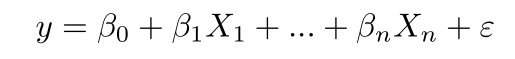

Dependent variable : humidity

Features:
- apparentTemperature
- windSpeed
- windBearing
- hour
- month


In [ ]:
# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Train the multiple linear regression model
model = LinearRegression()
model.fit(X_train, y_train)

# Make predictions on the training and test sets
y_pred_train = model.predict(X_train)
y_pred_test = model.predict(X_test)

# Evaluate the model
train_mse = mean_squared_error(y_train, y_pred_train)
test_mse = mean_squared_error(y_test, y_pred_test)
train_r2 = r2_score(y_train, y_pred_train)
test_r2 = r2_score(y_test, y_pred_test)

print(f'Training MSE: {train_mse}')
print(f'Test MSE: {test_mse}')
print(f'Training R2: {train_r2}')
print(f'Test R2: {test_r2}')

# Perform Hypothesis Testing and Summary using statsmodels
X_train_sm = sm.add_constant(X_train)  # Add a constant to the model (intercept)
sm_model = sm.OLS(y_train, X_train_sm).fit()
print(sm_model.summary())

Training MSE: 0.020662154469594737
Test MSE: 0.020698581589072847
Training R2: 0.45883796752921424
Test R2: 0.4596408023998928
                            OLS Regression Results                            
Dep. Variable:               humidity   R-squared:                       0.459
Model:                            OLS   Adj. R-squared:                  0.459
Method:                 Least Squares   F-statistic:                 1.308e+04
Date:                Thu, 30 Jan 2025   Prob (F-statistic):               0.00
Time:                        14:48:51   Log-Likelihood:                 40175.
No. Observations:               77142   AIC:                        -8.034e+04
Df Residuals:                   77136   BIC:                        -8.028e+04
Df Model:                           5                                         
Covariance Type:            nonrobust                                         
                          coef    std err          t      P>|t|      [0.025      0.

The model explains 46% of the variation in the humidity as explained by the adjusted r squared. The values of the R squared and adjusted R squared are equal which is a good sign. This indicates that there's no proof of overfitting and that all the features in the model are meaningful and contribute to explaining the dependent variable. The p value is small and the F stat is significant.

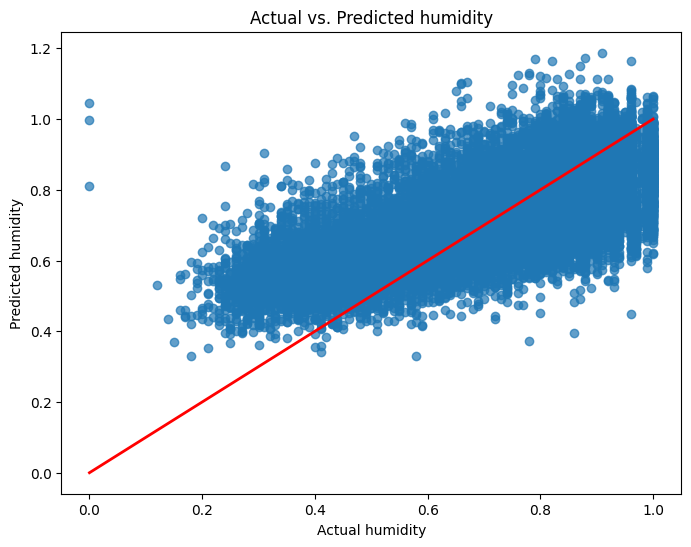

In [ ]:
# Visualizing actual vs. predicted humidity
y_pred = model.predict(X_test)
plt.figure(figsize=(8, 6))
plt.scatter(y_test, y_pred, alpha=0.7)
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], color='red', linewidth=2)
plt.title('Actual vs. Predicted humidity')
plt.xlabel('Actual humidity')
plt.ylabel('Predicted humidity')
plt.show()

Let's try a a non-linear regression model to see if we can improve the adjusted r squared : polynomial model


**We will use Cross-Validation to choose the best degree to use.**

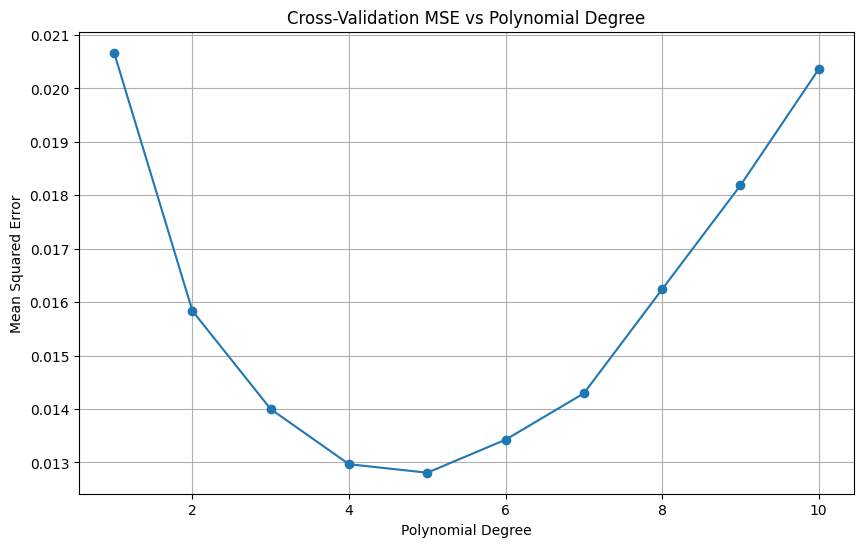

Best Polynomial Degree: 5


In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.preprocessing import PolynomialFeatures
from sklearn.linear_model import LinearRegression
from sklearn.pipeline import make_pipeline


# Define feature names and target variable
feature_names = ['apparentTemperature', 'windSpeed', 'windBearing', 'hour', 'month']
X = data[feature_names]
y = data['humidity']

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Function to evaluate model performance with cross-validation
def evaluate_model(degree):
    poly_features = PolynomialFeatures(degree=degree)
    model = make_pipeline(poly_features, LinearRegression())

    # Perform cross-validation
    cv_scores = cross_val_score(model, X_train, y_train, cv=3, scoring='neg_mean_squared_error')
    mean_cv_score = -np.mean(cv_scores)  # Convert negative MSE to positive MSE
    return mean_cv_score

# Define the range of polynomial degrees to test
degrees = range(1, 11)  # Test degrees from 1 to 10

# Evaluate models
cv_scores = [evaluate_model(degree) for degree in degrees]

# Plot the results
plt.figure(figsize=(10, 6))
plt.plot(degrees, cv_scores, marker='o')
plt.xlabel('Polynomial Degree')
plt.ylabel('Mean Squared Error')
plt.title('Cross-Validation MSE vs Polynomial Degree')
plt.grid(True)
plt.show()

# Print best degree
best_degree = degrees[np.argmin(cv_scores)]
print(f'Best Polynomial Degree: {best_degree}')

n = 5

Training MSE: 0.012722468417983981
Test MSE: 0.012554814684269427
Training R2: 0.6667861099744923
Test R2: 0.672242778587721


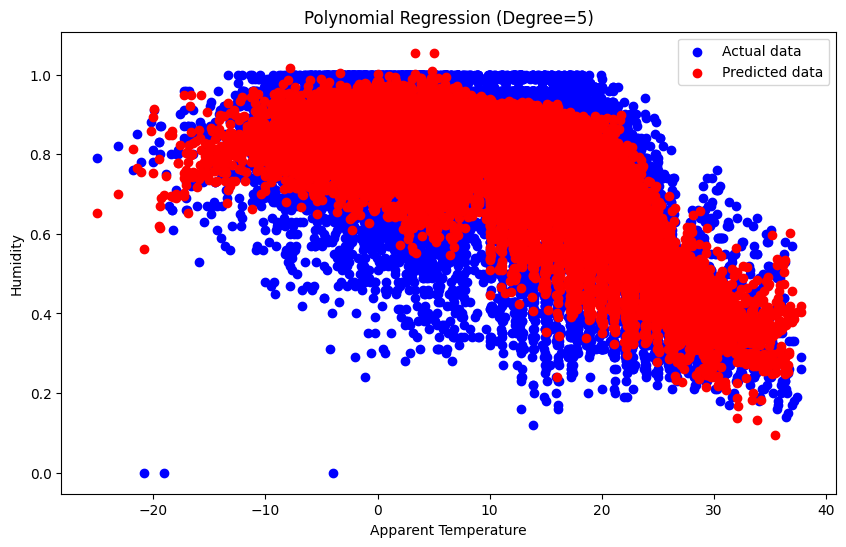

In [65]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import PolynomialFeatures
from sklearn.linear_model import LinearRegression
from sklearn.pipeline import make_pipeline
from sklearn.metrics import mean_squared_error, r2_score

# Define feature names and target variable
feature_names = ['apparentTemperature', 'windSpeed', 'windBearing', 'hour', 'month']
X = data[feature_names]
y = data['humidity']

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Create polynomial features
degree = 5  # You can change the degree to try different polynomial orders
poly_features = PolynomialFeatures(degree=degree)

# Create a pipeline that combines polynomial features and linear regression
model = make_pipeline(poly_features, LinearRegression())
model.fit(X_train, y_train)

# Make predictions on the training and test sets
y_pred_train = model.predict(X_train)
y_pred_test = model.predict(X_test)

# Evaluate the model
train_mse = mean_squared_error(y_train, y_pred_train)
test_mse = mean_squared_error(y_test, y_pred_test)
train_r2 = r2_score(y_train, y_pred_train)
test_r2 = r2_score(y_test, y_pred_test)

print(f'Training MSE: {train_mse}')
print(f'Test MSE: {test_mse}')
print(f'Training R2: {train_r2}')
print(f'Test R2: {test_r2}')

# Visualize results for a single feature (apparentTemperature)
# Note: Visualization might be complex for multiple features

plt.figure(figsize=(10, 6))
plt.scatter(X_test['apparentTemperature'], y_test, color='blue', label='Actual data')
plt.scatter(X_test['apparentTemperature'], y_pred_test, color='red', label='Predicted data')
plt.xlabel('Apparent Temperature')
plt.ylabel('Humidity')
plt.title('Polynomial Regression (Degree=5)')
plt.legend()
plt.show()

We notice that this model is better with an adjusted r squared of 0.67 ( Training and Test R squared are almost equal at 0.67) so we will adopt it.

**Interpretation**: The model explains approximately 67% of the variation in humidity using the specified features. This is an improvement over the previous multiple linear regression model, indicating that a non-linear relationship might be a better fit for the data.

In [68]:
# Get the LinearRegression model from the pipeline
linear_reg_model = model.named_steps['linearregression']

# Create a statsmodels OLS model using the trained coefficients
X_train_poly = poly_features.fit_transform(X_train) # Transform training data
X_train_poly = sm.add_constant(X_train_poly) # statsmodels requires intercept

# Instantiate and fit the statsmodels model
ols_model = sm.OLS(y_train, X_train_poly).fit()

# Print the summary
print(ols_model.summary())

                            OLS Regression Results                            
Dep. Variable:               humidity   R-squared:                       0.681
Model:                            OLS   Adj. R-squared:                  0.680
Method:                 Least Squares   F-statistic:                     666.8
Date:                Thu, 30 Jan 2025   Prob (F-statistic):               0.00
Time:                        15:26:19   Log-Likelihood:                 60540.
No. Observations:               77142   AIC:                        -1.206e+05
Df Residuals:                   76895   BIC:                        -1.183e+05
Df Model:                         246                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.9165      0.037     24.480      0.0

**Remark** : Given the complexity and interpretability challenges associated with higher-degree polynomial regression, the model was simplified to the previous linear regression (degree = 1). This allows for clearer analysis and interpretation of the relationships between the input variables and the target, while avoiding potential overfitting and computational inefficiencies.

In [69]:
print(sm_model.summary())

                            OLS Regression Results                            
Dep. Variable:               humidity   R-squared:                       0.459
Model:                            OLS   Adj. R-squared:                  0.459
Method:                 Least Squares   F-statistic:                 1.308e+04
Date:                Thu, 30 Jan 2025   Prob (F-statistic):               0.00
Time:                        15:34:34   Log-Likelihood:                 40175.
No. Observations:               77142   AIC:                        -8.034e+04
Df Residuals:                   77136   BIC:                        -8.028e+04
Df Model:                           5                                         
Covariance Type:            nonrobust                                         
                          coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------
const                   0.9023    

All variables are statistically significant (p values are small and 0 does not belong to CI)

**Equation : Y = 0.9023 -0.0115X1 - 0.0071X2 + 8.581e-05X3 - 0.0027X4 + 0.0076X5**



Let's try adding an interaction term and see if it improves the model or not. We have a doubt whether windBearing and windSpeed do make an extra contribution to the model when they're both present.

In [72]:
import pandas as pd
import numpy as np
import statsmodels.api as sm
from sklearn.preprocessing import PolynomialFeatures

# Create interaction terms (example: interaction between windBearing and windSpeed)
data['windBearing_windSpeed'] = data['windBearing'] * data['windSpeed']

# Define Independent and Dependent Variables
# Select features (including interaction terms)
X = data[['apparentTemperature', 'windSpeed', 'windBearing', 'hour', 'month',
          'windBearing_windSpeed']]
y = data['humidity']  # Target variable

# 3. Add Constant (Intercept) to the Model
X = sm.add_constant(X)

# 4. Fit the Model using statsmodels OLS
model = sm.OLS(y, X).fit()

# 5. View Results (Summary)
print(model.summary())

                            OLS Regression Results                            
Dep. Variable:               humidity   R-squared:                       0.459
Model:                            OLS   Adj. R-squared:                  0.459
Method:                 Least Squares   F-statistic:                 1.364e+04
Date:                Thu, 30 Jan 2025   Prob (F-statistic):               0.00
Time:                        15:42:45   Log-Likelihood:                 50213.
No. Observations:               96428   AIC:                        -1.004e+05
Df Residuals:                   96421   BIC:                        -1.003e+05
Df Model:                           6                                         
Covariance Type:            nonrobust                                         
                            coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------
const                     0.90

The newly added variable is statistically significant but it doesn't improve the model (i.e : increase the adjusted r squared) so we will not add it and we will go back to our previous model.

Final Equation :
Y = 0.9023 -0.0115X1 - 0.0071X2 + 8.581e-05X3 - 0.0027X4 + 0.0076X5

with :   
- Y : humidity
- X1 : apparentTemperature
- X2 : windSpeed
- X3 : windBearing
- X4 : hour
- X5 : month

**Validation of the Assumptions of Linear Regression**


Linearity

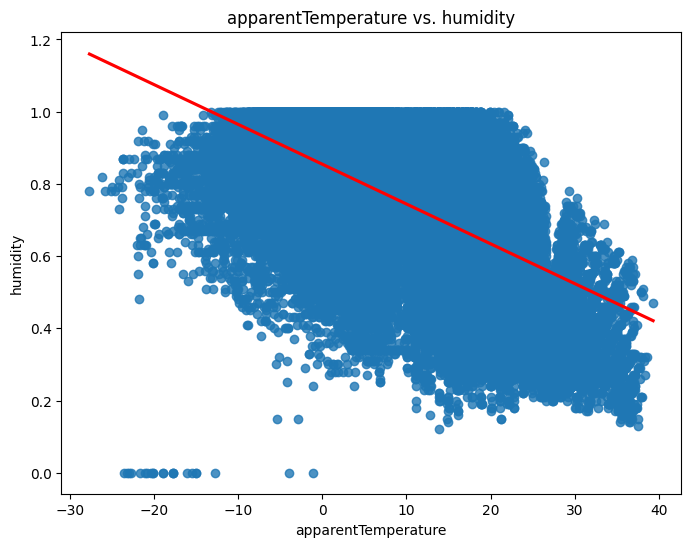

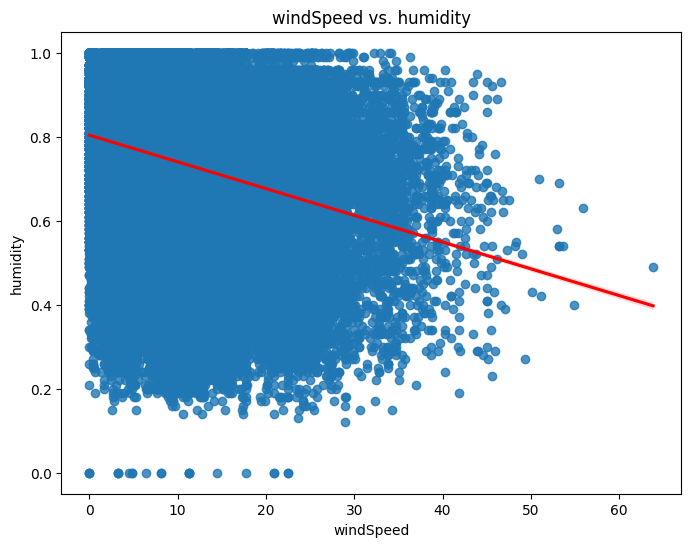

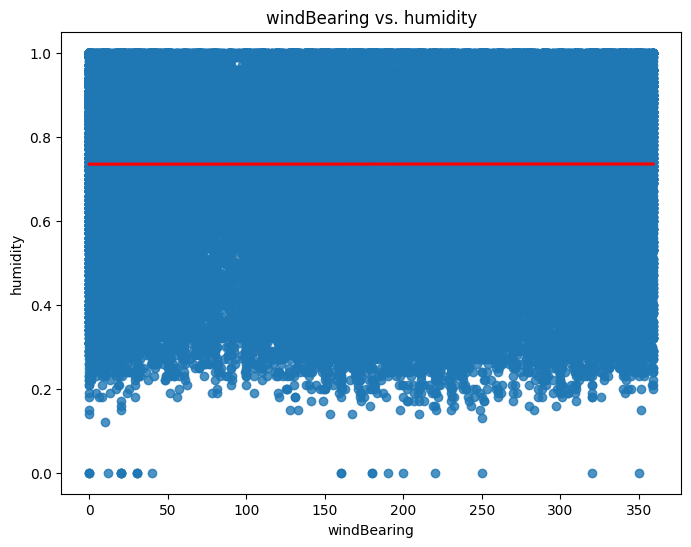

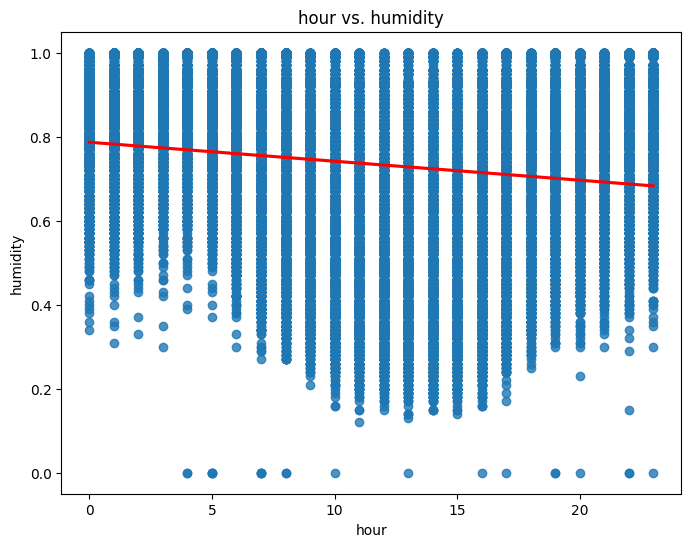

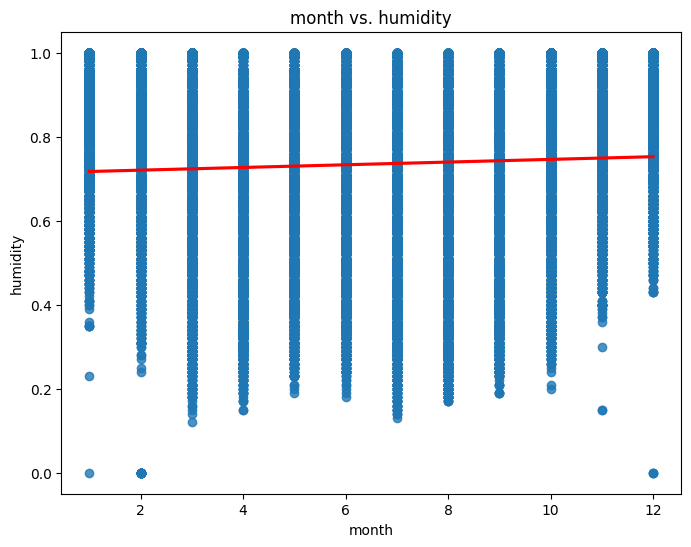

In [89]:
import statsmodels.api as sm
import matplotlib.pyplot as plt

# Assuming your DataFrame is named 'data' and contains the following columns:
# - 'apparentTemperature'
# - 'windSpeed'
# - 'windBearing'
# - 'hour'
# - 'month'
# - 'humidity'

# Independent and dependent variables
X = data[['apparentTemperature', 'windSpeed', 'windBearing', 'hour', 'month']]
y = data['humidity']


for predictor in ['apparentTemperature', 'windSpeed', 'windBearing', 'hour', 'month']:
    plt.figure(figsize=(8, 6))
    sns.regplot(x=data[predictor], y=data['humidity'], line_kws={'color': 'red'})
    plt.title(f'{predictor} vs. humidity')
    plt.show()


Remark : The model with n degrees equal to 5 is the best model but we transformed it back to a model with n equal to 1 which explains the gotten plots.

Independence of errors

In [84]:
from statsmodels.stats.stattools import durbin_watson
dw = durbin_watson(sm_model.resid)
print("Durbin-Watson statistic:", dw)

Durbin-Watson statistic: 2.0053339023815613


a Durbin-Watson statistic of 2 indicates the absence of autocorrelation in the residuals

Normality

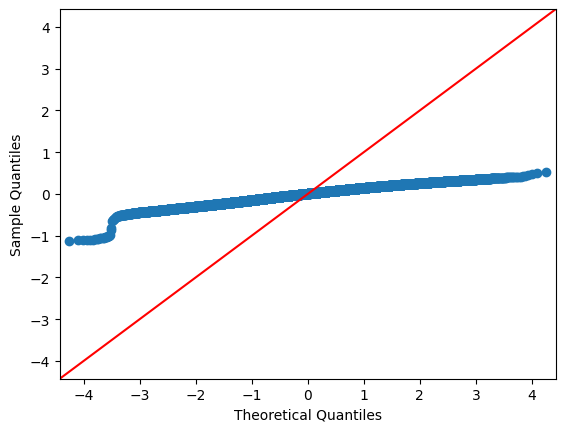

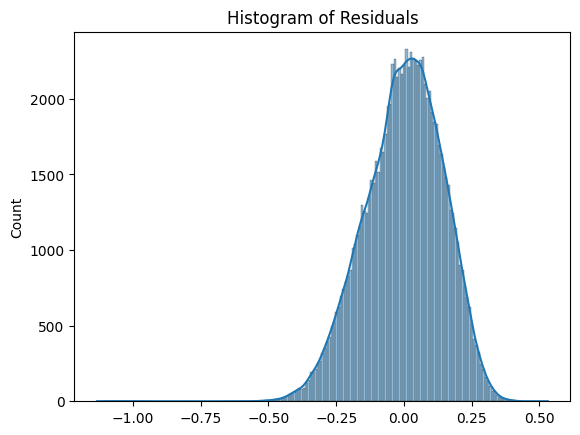

In [90]:
sm.qqplot(residuals, line='45')
plt.show()

sns.histplot(residuals, kde=True)
plt.title("Histogram of Residuals")
plt.show()

In [91]:
from scipy.stats import shapiro
shapiro_test = shapiro(residuals)
print("Shapiro-Wilk p-value:", shapiro_test.pvalue)

Shapiro-Wilk p-value: 4.120212406929541e-56


/usr/local/lib/python3.11/dist-packages/scipy/stats/_axis_nan_policy.py:531: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 96428.
  res = hypotest_fun_out(*samples, **kwds)


The data is not normally distributed.

Homoscedasticity

In [82]:
from statsmodels.stats.diagnostic import het_breuschpagan
bp_test = het_breuschpagan(residuals, X)
print("Breusch-Pagan p-value:", bp_test[1])

Breusch-Pagan p-value: 0.0


A Breusch-Pagan p-value of 0.0 indicates that we fail to reject the null hypothesis of homoscedasticity. This means there is no significant evidence of heteroscedasticity in the model, and the residuals likely have constant variance.

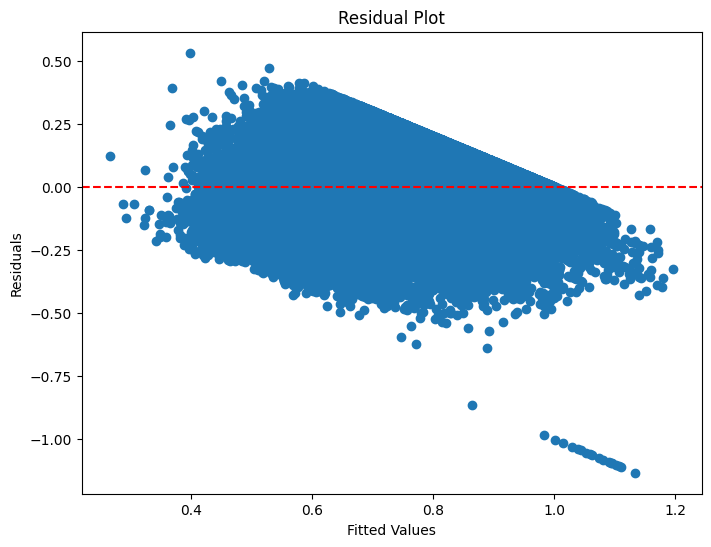

In [87]:
plt.figure(figsize=(8, 6))
plt.scatter(sm_model.predict(sm.add_constant(X_train)), sm_model.resid)
plt.xlabel('Fitted Values')
plt.ylabel('Residuals')
plt.title('Residual Plot')
plt.axhline(y=0, color='red', linestyle='--')
plt.show()

**Summary of Assumptions:**
* Linearity: Met.
* Homoscedasticity: No significant evidence of violation.
* Normality: Violated; residuals deviate significantly from normality.
* Independence of Errors: Met.
* Multicollinearity: No significant issues.


**Model Fit**


R-squared (0.67): Approximately 67% of the variance in the dependent variable (humidity) is explained by the model.


Adjusted R-squared (0.67): After adjusting for the number of predictors and the polynomial terms, the model still explains 67% of the variance, indicating a good fit and minimal overfitting.

**Coefficients**

**const (0.9023)**: This is the intercept. When all independent variables are zero, the predicted humidity is approximately 0.90.

**apparentTemperature (-0.0115)**: For every unit increase in apparent temperature, humidity decreases by approximately 0.0115 units, holding other variables constant. This variable is statistically significant (low p-value).

**windSpeed (-0.0071)**: For every unit increase in wind speed, humidity decreases by approximately 0.0071 units, holding other variables constant. This variable is statistically significant (low p-value).

**windBearing (8.581e-05)**: For every unit increase in wind bearing, humidity increases by a very small amount (8.581e-05 units), holding other variables constant. Although statistically significant, the effect is likely negligible in practice.

**hour (-0.0027)**: For every unit increase in hour, humidity decreases by approximately 0.0027 units, holding other variables constant. This variable is statistically significant (low p-value).

**month (0.0076)**: For every unit increase in month, humidity increases by approximately 0.0076 units, holding other variables constant. This variable is statistically significant (low p-value).

**Model Selection**


The Polynomial regression model with degree 5 provides a better fit compared to the simple linear regression model as indicated by higher R-squared and adjusted R-squared values. This suggests a non-linear relationship between the predictors and humidity.

**Important Note**: The complexity of interpreting polynomial terms in the Polynomial Regression model is acknowledged. Therefore, conclusions primarily draw upon results and analysis from the basic linear regression for greater clarity.

**Prediction model**

In [98]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import PolynomialFeatures
from sklearn.pipeline import make_pipeline
import statsmodels.api as sm # Import statsmodels


# Assuming 'model' is your trained polynomial regression model (pipeline)
# Assuming 'poly_features' is your PolynomialFeatures object (degree=5)

# New data for prediction
new_data = {
    "apparentTemperature": [15, 20, 25],
    "windSpeed": [5, 10, 15],
    "windBearing": [180, 270, 360],
    "hour": [10, 14, 18],
    "month": [6, 8, 10],
}

# Create DataFrame for new data
new_df = pd.DataFrame(new_data)

# Transform new data using polynomial features
# new_X_poly = poly_features.transform(new_df) # This line might not be necessary anymore if using the linear model (sm_model)

# Add a constant column to the new data for the intercept term
new_df = sm.add_constant(new_df)

# Predict humidity using the linear model (sm_model)
predictions = sm_model.predict(new_df)

# Display predictions
new_df["Predicted_humidity"] = predictions
new_df

,const,apparentTemperature,windSpeed,windBearing,hour,month,Predicted_humidity
0,1.0,15,5,180,10,6,0.728233
1,1.0,20,10,270,14,8,0.647408
2,1.0,25,15,360,18,10,0.566582


Example : Humidity is predicted to be equal to 0.73 when the apparent temperature is 15 degrees C, wind speed is 5 m/h, wind bearing is 180 degrees, at 10 am in the morning in June.